<center>Machine Learning  Project - Beginner Level </center>

## <center> Customer Classification using Logistic Regression</center>

# Company Introduction
### Your client for this project is a retail banking institution.

- They are going to float a stock trading facility for their existing customers.
- The idea is to use data to classify whether a customer belongs to a high net worth or low net worth group.
- They will have to incentivize their customers to adopt their offerings.
- One way to incentivize is to offer discounts on the commission for trading transactions.

# Problem Statement
- The company rolled out this service to about 10,000+ of its customers and observed their trading behavior for 6 months and after that, they labeled them into two revenue grids 1 and 2

- The current process suffers from the following problems:

- One issue is that only about 10% of the customers do enough trades for earnings after discounts to be profitable.
- The company wants to figure out, which are those 10% customers so that it can selectively offer them a discount.

- The marketing department has hired you as a data science consultant because they want to supplement their campaigns with a more proactive approach.


# Project Deliverables
- To build a classification model using the datasets.
- Deliverable: Predict whether a customer belongs to a high net worth or low net worth group.
- Machine Learning Task: Classification
- Target Variable: Status (high net worth (1) / low net worth (2))
- Win Condition: N/A (best possible model)
- Evaluation Metric : F1 Score score.

# Dataset Feature Description
- The Dataset contains the following columns:

| Column  |Description   |
| :------------ | :------------ |
|REF_NO|  Reference Number of the customer. |
|children|Number of children each customer has.|
|age_band|Age Group to which the customer belongs.|
|status|Marital Status of the customer.|
|occupation|Job or profession of the customer.|
|occupation_partner|Job or profession of the customer's partner.|
|home_status|Home Status of the customers.|
|family_income|Income Range of the customer's family.|
|self_employed|Whether self-employed or not.|
|self_employed_partner|Whether the partner self-employed or not.|
|year_last_moved|Moving Year from the last location of the customer.|
|TV area | Television Region of the customer.|
|post_code| Postal Code of the customer.
|post_area | Postal Area of the customer.|
|average_Credit_Card_Transaction | Average Credit Card Transaction per year by the customer.|
|balance_Transfer | Transfer of the Balance in an account to another account by the customer.|
|term_Deposit | Cash Investment Help at Financial Institute provided to the customer.|
|life_Insurance | Basic Life Insurance Coverage of the customer.|
|medical_Insurance | Medical Insurance Coverage of the customer.|
|average_A/C_Balance | Average Balance in the account of the customer.|
|personal_Loan | Amount of Personal Loan taken by the customer.|
|investment_in_Mutual_Fund | Amount Invested in Mutual Funds by the customer.|
|investment_Tax_Saving_Bond | Amount Invested in Tax Saving Bond by the customer.|
|home_Loan | Amount of Home Loan taken by the customer.|
|online_Purchase_Amount | Amount spent by the customer on online purchases.|
|gender | Gender of the customer.|
|region | Region of the customer.|
|investment_in_Commodity | Amount Invested in Commodity by the customer.|
|investment_in_Equity | Amount Invested in Equity by the customer.|
|investment_in_Derivative | Amount Invested in Derivatives by the customer.|
|portfolio_Balance | Balanced Investment Strategy of the customer.|
|revenue_Grid | Grid report of the customers.|

---
<a name = Section4></a>
#  Data Acquisition & Description
---


- We are provided with a dataset containing all the necessary information about the customers like their occupation, family income, gender, region, balance transfer, children, etc.

- Also included in the dataset is the column Revenue_Grid which classifies the customers into high net worth customers (1) and low net worth customers (2).

- This is the data that we have to predict for future customers.


- The dataset is divided into two parts: Train, and Test sets.

Train Set:
- The train set contains 8124 rows and 32 columns.
- The last column Revenue_Grid is the target variable.

Test Set:
- The test set contains 2031 rows and 31 columns.
- The test set doesn’t contain the Revenue_Grid column.

It needs to be predicted for the test set.

---
<a name = Section3></a>
#  Importing Libraries
---

In [217]:
import pandas as pd                                                
pd.set_option('display.max_columns', None)                          
pd.set_option('display.max_colwidth', None)                         
pd.set_option('display.max_rows', None)                             
pd.set_option('mode.chained_assignment', None)                      
# To suppress scientific notation over exponential values
#pd.set_option('display.float_format', lambda x: '%.5f' % x)        
import numpy as np                                                  
import matplotlib.pyplot as plt                                     
import seaborn as sns                                               
import plotly.graph_objs as go                                      
%matplotlib inline
import sklearn.metrics

from sklearn.preprocessing import StandardScaler                    
from sklearn.model_selection import train_test_split                
from sklearn.ensemble import RandomForestRegressor                  
from sklearn.linear_model import LinearRegression                   
                               
from random import randint                                          
import warnings                                                     
warnings.filterwarnings("ignore")                                   
from pandas import set_option 
set_option('display.width' , 100)

set_option('precision' , 3)

In [218]:
from sklearn.linear_model import LogisticRegression    
from sklearn import metrics
from sklearn.metrics import accuracy_score                          
from sklearn.metrics import precision_score                         
from sklearn.metrics import recall_score                            
from sklearn.metrics import precision_recall_curve                  
from sklearn.metrics import confusion_matrix                        
from sklearn.metrics import f1_score                                
from sklearn.metrics import roc_curve                                          
from sklearn.model_selection import train_test_split                
from sklearn.metrics import classification_report

In [219]:
cc_train_data = pd.read_csv(filepath_or_buffer = "existing_base_train.csv")
cc_test_data = pd.read_csv(filepath_or_buffer = "existing_base_test.csv")

In [220]:
print('Shape of the training dataset:', cc_train_data.shape)
print('Shape of the testing dataset:', cc_test_data.shape)

Shape of the training dataset: (8124, 32)
Shape of the testing dataset: (2031, 31)


In [221]:
cc_train_data.head()

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid
0,5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,Meridian,M51 0GU,M51,26.98,29.99,312.25,299.79,88.72,108.85,175.43,134.35,8.98,55.44,7.68,Female,North West,151.55,81.79,136.02,360.37,2
1,9091,Zero,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,Meridian,L40 2AG,L40,35.98,74.48,0.00,99.96,10.99,48.45,15.99,0.00,0.00,0.00,18.99,Female,North West,44.28,13.91,29.23,89.22,2
2,9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,HTV,TA19 9PT,TA19,0.00,24.46,0.00,18.44,0.00,0.00,0.02,10.46,0.00,0.00,0.00,Female,South West,8.58,1.75,4.82,14.50,2
3,10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,Scottish TV,FK2 9NG,FK2,44.99,0.00,0.00,0.00,29.99,0.00,0.00,0.00,0.00,0.00,0.00,Female,Scotland,15.00,0.00,5.00,68.98,2
4,1987,Zero,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,Yorkshire,LS23 7DJ,LS23,0.00,0.00,0.00,0.00,0.00,0.00,0.00,9.98,0.00,0.00,0.00,Female,Unknown,0.00,1.66,1.66,1.88,2


<a name = Section41></a>
###  Data Description

- In this section we will get **information about the data** and see some observations.

In [222]:
cc_train_data.describe().T.style.highlight_min(color='lime')

,count,mean,std,min,25%,50%,75%,max
REF_NO,8124.000,5797.343,3322.498,2.000,2924.750,5811.500,8681.500,11518.000
year_last_moved,8124.000,1967.877,182.564,0.000,1978.000,1988.000,1994.000,1999.000
Average_Credit_Card_Transaction,8124.000,23.251,51.147,0.000,0.000,0.000,23.480,662.260
Balance_Transfer,8124.000,46.083,79.085,0.000,0.000,17.485,64.990,2951.760
Term_Deposit,8124.000,27.285,54.134,0.000,0.000,0.000,34.490,784.820
Life_Insurance,8124.000,65.318,95.762,0.000,0.000,31.475,92.887,2930.410
Medical_Insurance,8124.000,18.826,32.022,0.000,0.000,0.010,26.970,591.040
Average_A/C_Balance,8124.000,31.838,45.249,0.000,0.000,14.980,45.922,626.240
Personal_Loan,8124.000,25.416,85.130,0.000,0.000,0.000,20.828,4905.930
Investment_in_Mutual_Fund,8124.000,41.724,64.416,0.000,0.000,23.480,59.440,2561.270


**Observations**:

- We are provided with an __imbalanced dataset__.

- The dataset contains __8124  observations__ and __32 columns__.

- The **target** feature is **numeric** and have **2** units.

- It **ranges** from **1** units upto **2** units.

In [223]:
cc_train_data.skew()

REF_NO                             -0.013
year_last_moved                   -10.640
Average_Credit_Card_Transaction     3.761
Balance_Transfer                    8.174
Term_Deposit                        4.174
Life_Insurance                      5.509
Medical_Insurance                   3.362
Average_A/C_Balance                 2.690
Personal_Loan                      26.160
Investment_in_Mutual_Fund           9.667
Investment_Tax_Saving_Bond          3.192
Home_Loan                           3.978
Online_Purchase_Amount             21.764
Investment_in_Commudity             4.816
Investment_in_Equity               11.525
Investment_in_Derivative           12.462
Portfolio_Balance                   8.895
Revenue_Grid                       -2.563
dtype: float64

<a name = Section42></a>
### Data Information

- In this section we will see the **information about the types of features**.

In [224]:
cc_train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           8124 non-null   int64  
 1   children                         8124 non-null   object 
 2   age_band                         8124 non-null   object 
 3   status                           8124 non-null   object 
 4   occupation                       8124 non-null   object 
 5   occupation_partner               8124 non-null   object 
 6   home_status                      8124 non-null   object 
 7   family_income                    8124 non-null   object 
 8   self_employed                    8124 non-null   object 
 9   self_employed_partner            8124 non-null   object 
 10  year_last_moved                  8124 non-null   int64  
 11  TVarea                           8124 non-null   object 
 12  post_code           

**Observations**:

- The dataset has **8124** rows, and **32** features.

- **Out of 32** features present, **15** are of **float64** datatype

- **3** features have **int64** datatype,  including our target feature.

- Only **14 feature** has **object** datatype 

In [225]:
cc_test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           2031 non-null   int64  
 1   children                         2031 non-null   object 
 2   age_band                         2031 non-null   object 
 3   status                           2031 non-null   object 
 4   occupation                       2031 non-null   object 
 5   occupation_partner               2031 non-null   object 
 6   home_status                      2031 non-null   object 
 7   family_income                    2031 non-null   object 
 8   self_employed                    2031 non-null   object 
 9   self_employed_partner            2031 non-null   object 
 10  year_last_moved                  2031 non-null   int64  
 11  TVarea                           2031 non-null   object 
 12  post_code           

<a name = Section5></a>

---
#  Data Pre-Processing
---

- We **can't use pandas profiling** on such a large dataset as it will throw **memory error**.

<a name = Section51></a>
### Checking for Missing Data

- In this section, we will **identify missing data** and take appropriate measures if **necessary**.

In [226]:
cc_train_data.isnull().sum().any()

False

In [227]:
cc_test_data.isnull().sum().any()

False

In [228]:
print('Do Training data have any duplicate Rows ?', cc_train_data.duplicated().any())
print('Do TESTING data have any duplicate Rows ?', cc_test_data.duplicated().any())

Do Training data have any duplicate Rows ? False
Do TESTING data have any duplicate Rows ? False


- There are **no missing values** present in the dataset.

In [229]:
percent_missing = cc_train_data.isnull().sum() * 100 / len(cc_train_data)
missing_values = pd.DataFrame({'NaNs percentage': percent_missing})
missing_values.sort_values(by ='NaNs percentage' , ascending=False).T.style.background_gradient(cmap='winter')

,REF_NO,children,Portfolio_Balance,Investment_in_Derivative,Investment_in_Equity,Investment_in_Commudity,region,gender,Online_Purchase_Amount,Home_Loan,Investment_Tax_Saving_Bond,Investment_in_Mutual_Fund,Personal_Loan,Average_A/C_Balance,Medical_Insurance,Life_Insurance,Term_Deposit,Balance_Transfer,Average_Credit_Card_Transaction,post_area,post_code,TVarea,year_last_moved,self_employed_partner,self_employed,family_income,home_status,occupation_partner,occupation,status,age_band,Revenue_Grid
NaNs percentage,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


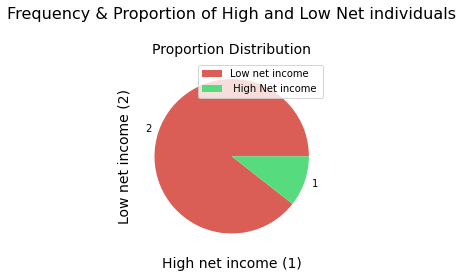

In [230]:
cc_train_data['Revenue_Grid'].value_counts().plot(kind = 'pie',legend = True, colors = ['#DB5E56','#56DB7F'])
plt.legend(['Low net income', ' High Net income '])
plt.xlabel(xlabel = 'High net income (1)', size = 14)
plt.ylabel(ylabel = 'Low net income (2)', size = 14)
plt.title(label = 'Proportion Distribution', size = 14)
plt.tight_layout(pad = 3.0)
plt.suptitle(t = 'Frequency & Proportion of High and Low Net individuals', y = 1.02, size = 16)
plt.show()

In [231]:
cc_train_data["Revenue_Grid"].value_counts(normalize=True)

2    0.894
1    0.106
Name: Revenue_Grid, dtype: float64

- The Target Variable looks highly imbalanced
- Target Variable: high net worth (1) is only 10 %  and low net worth (2) are 90 % . I think a distbn of 10% of HNI(Label 1) and 90% of LNI (Label 2)

<a name = Section52></a>
## Data Cleaning



In [232]:
# Only for columns of train data set
cc_train_data.columns = cc_train_data.columns.str.lower().str.replace(' ', '_')

In [233]:
# Only for columns of train data set
cc_test_data.columns = cc_test_data.columns.str.lower().str.replace(' ', '_')

In [237]:
cc_train_data.set_index("ref_no", inplace = True )
cc_test_data.set_index("ref_no", inplace = True)

KeyError: "None of ['ref_no'] are in the columns"

In [238]:
cc_train_data.sample(30)

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,tvarea,post_code,post_area,average_credit_card_transaction,balance_transfer,term_deposit,life_insurance,medical_insurance,average_a/c_balance,personal_loan,investment_in_mutual_fund,investment_tax_saving_bond,home_loan,online_purchase_amount,gender,region,investment_in_commudity,investment_in_equity,investment_in_derivative,portfolio_balance,revenue_grid
ref_no,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
6849,Zero,61-65,Single/Never Married,Retired,Manual Worker,Own Home,"<22,500, >=20,000",No,No,1972,Granada,WN2 2SN,WN2,0.00,0.00,114.47,20.99,0.00,38.46,65.44,27.96,34.42,27.95,51.46,Female,North West,27.09,40.95,31.21,147.27,2
7491,Zero,65-70,Widowed,Retired,Unknown,Own Home,"<15,000, >=12,500",No,No,1978,Meridian,RG27 8DJ,RG27,119.48,97.97,9.99,64.98,21.97,0.00,54.95,93.44,30.00,18.96,86.37,Female,South East,62.88,47.29,44.22,135.90,1
8002,Zero,22-25,Partner,Professional,Manual Worker,Rent Privately,">=35,000",No,No,1997,Carlton,WA6 0DB,WA6,94.47,139.48,0.00,55.49,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Female,North West,57.89,0.00,9.25,48.96,2
6166,Zero,31-35,Single/Never Married,Business Manager,Unknown,Own Home,"<20,000, >=17,500",No,No,1993,Central,B62 9SX,B62,0.00,24.99,0.00,8.98,0.00,39.97,149.41,19.48,2.49,4.48,22.48,Female,West Midlands,6.79,39.72,36.72,111.59,2
9122,Zero,55-60,Partner,Manual Worker,Secretarial/Admin,Own Home,"<22,500, >=20,000",No,No,1967,Anglia,PE4 7UB,PE4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,27.47,14.48,0.00,0.00,Male,East Anglia,0.00,6.99,6.99,-45.98,2
2657,1,45-50,Partner,Professional,Housewife,Own Home,"<30,000, >=27,500",No,No,1985,Central,DE56 4FX,DE56,36.97,0.00,0.00,28.98,12.99,0.00,38.97,13.99,0.00,0.00,4.99,Male,East Midlands,15.79,9.66,15.82,67.52,2
535,Zero,55-60,Widowed,Retired,Unknown,Own Home,"<12,500, >=10,000",No,No,1997,Yorkshire,YO21 1HZ,YO21,274.75,0.00,21.48,0.00,38.94,1.00,0.00,0.00,0.00,0.00,0.00,Female,Unknown,67.03,0.17,6.66,21.67,1
351,Zero,31-35,Partner,Secretarial/Admin,Secretarial/Admin,Own Home,"<27,500, >=25,000",No,No,1990,Yorkshire,S35 8QU,S35,0.00,24.99,0.00,93.96,0.00,7.99,34.47,35.98,1.00,0.00,0.00,Female,Unknown,23.79,13.24,28.90,61.04,2
10888,3,41-45,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,Yes,1982,Yorkshire,HU13 9BZ,HU13,0.00,86.97,0.00,45.97,0.00,54.49,0.00,0.00,0.00,0.00,0.00,Female,Unknown,26.59,9.08,16.74,86.55,2


In [239]:
for cols in cc_train_data.columns:
    print("cols",cols, "unique",  cc_train_data[cols].nunique())
#g = pd.DataFrame({'col' : cols, 'unique' : cc_train_data[cols].nunique()})   
#g

cols children unique 5
cols age_band unique 13
cols status unique 5
cols occupation unique 9
cols occupation_partner unique 9
cols home_status unique 5
cols family_income unique 13
cols self_employed unique 2
cols self_employed_partner unique 2
cols year_last_moved unique 94
cols tvarea unique 14
cols post_code unique 8050
cols post_area unique 1937
cols average_credit_card_transaction unique 1209
cols balance_transfer unique 1860
cols term_deposit unique 1215
cols life_insurance unique 2655
cols medical_insurance unique 1362
cols average_a/c_balance unique 1923
cols personal_loan unique 1477
cols investment_in_mutual_fund unique 2130
cols investment_tax_saving_bond unique 718
cols home_loan unique 760
cols online_purchase_amount unique 1128
cols gender unique 3
cols region unique 13
cols investment_in_commudity unique 3081
cols investment_in_equity unique 2812
cols investment_in_derivative unique 3269
cols portfolio_balance unique 6884
cols revenue_grid unique 2


- In this below section, we will **remove** columns which are **redundant** for model.

- We will first remove the **ID** column then remove the columns with **standard deviation = 0** from the dataset.

- Standard Deviation = 0 means that **every data point in a column is equal to its mean**.

- Also means that all of a column's values are **identical** and such columns do **not help** us in **prediction** so we will drop them.

Text(0.5, 0.98, 'Distplot for average ac balance ')

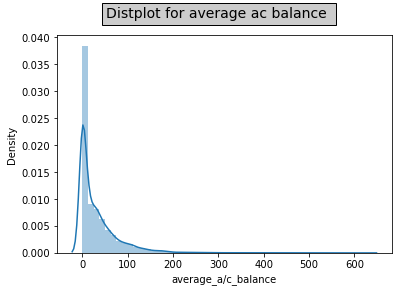

In [240]:
sns.distplot(cc_train_data["average_a/c_balance"])
plt.suptitle("Distplot for average ac balance ", bbox={'facecolor':'0.8'},fontsize = 14)

Text(0.5, 0.98, 'Distplot for balance transfer')

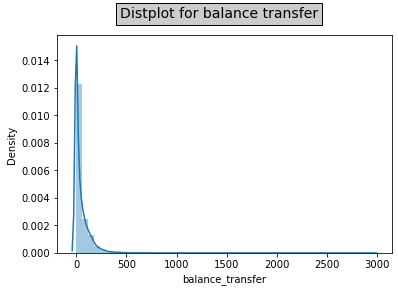

In [241]:
sns.distplot(cc_train_data["balance_transfer"])
plt.suptitle("Distplot for balance transfer", bbox={'facecolor':'0.8'},fontsize = 14)

In [242]:
cc_train_data2 = cc_train_data.copy()
cc_test_data2 = cc_test_data.copy()

In [243]:
cc_train_data2['total_investment'] = cc_train_data2['investment_in_mutual_fund'] + cc_train_data2['investment_tax_saving_bond'] +\
                                    cc_train_data2['investment_in_derivative'] + cc_train_data2['investment_in_commudity'] +\
                                    cc_train_data2['investment_in_equity'] + cc_train_data2['portfolio_balance']     
   

In [244]:
cc_test_data2['total_investment'] = cc_test_data2['investment_in_mutual_fund'] + cc_test_data2['investment_tax_saving_bond'] +\
                                    cc_test_data2['investment_in_derivative'] + cc_test_data2['investment_in_commudity'] +\
                                    cc_test_data2['investment_in_equity'] + cc_test_data2['portfolio_balance']     
   

In [245]:
cc_train_data2['total_insurance'] = cc_train_data2['life_insurance'] + cc_train_data2['medical_insurance']

In [246]:
# For testing data
cc_test_data2['total_insurance'] = cc_test_data2['life_insurance'] + cc_test_data2['medical_insurance']

In [247]:
cc_train_data2['total_loans'] = cc_train_data2['term_deposit'] + cc_train_data2['personal_loan'] + cc_train_data2['home_loan'] 

In [248]:
# For testing data
cc_test_data2['total_loans'] = cc_test_data2['term_deposit'] + cc_test_data2['personal_loan'] + cc_test_data2['home_loan'] 

In [249]:
cc_train_data2.drop(columns=['investment_in_mutual_fund', 'investment_tax_saving_bond',
                            'investment_in_derivative', 'investment_in_commudity', 'investment_in_equity',
                            'life_insurance', 'medical_insurance','term_deposit','personal_loan', 'home_loan',
                            'portfolio_balance'], axis=1, inplace = True)

In [250]:
cc_test_data2.drop(columns=['investment_in_mutual_fund', 'investment_tax_saving_bond',
                            'investment_in_derivative', 'investment_in_commudity', 'investment_in_equity',
                            'life_insurance', 'medical_insurance','term_deposit','personal_loan', 'home_loan',
                            'portfolio_balance'], axis=1, inplace = True)

In [251]:
cc_train_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,tvarea,post_code,post_area,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_investment,total_insurance,total_loans
ref_no,,,,,,,,,,,,,,,,,,,,,,,
5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,Meridian,M51 0GU,M51,26.98,29.99,108.85,7.68,Female,North West,2,873.06,388.51,543.12
9091,Zero,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,Meridian,L40 2AG,L40,35.98,74.48,48.45,18.99,Female,North West,2,176.64,110.95,15.99
9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,HTV,TA19 9PT,TA19,0.00,24.46,0.00,0.00,Female,South West,2,40.11,18.44,0.02
10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,Scottish TV,FK2 9NG,FK2,44.99,0.00,0.00,0.00,Female,Scotland,2,88.98,29.99,0.00
1987,Zero,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,Yorkshire,LS23 7DJ,LS23,0.00,0.00,0.00,0.00,Female,Unknown,2,15.18,0.00,0.00


In [252]:
print("New train data shape",cc_train_data2.shape)
print("Orignal shape of train data", cc_train_data.shape)

New train data shape (8124, 23)
Orignal shape of train data (8124, 31)


In [253]:
print("New shape of test data",cc_test_data2.shape)
print("Orignal shape of test data", cc_test_data.shape)

New shape of test data (2031, 22)
Orignal shape of test data (2031, 30)


In [254]:
cc_train_data2['nett_worth'] = cc_train_data2['total_investment'] - cc_train_data2['total_loans'] 
cc_train_data2.drop(columns=['total_investment','total_loans'], axis=1, inplace = True)
cc_train_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,tvarea,post_code,post_area,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,,,,
5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,Meridian,M51 0GU,M51,26.98,29.99,108.85,7.68,Female,North West,2,388.51,329.94
9091,Zero,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,Meridian,L40 2AG,L40,35.98,74.48,48.45,18.99,Female,North West,2,110.95,160.65
9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,HTV,TA19 9PT,TA19,0.00,24.46,0.00,0.00,Female,South West,2,18.44,40.09
10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,Scottish TV,FK2 9NG,FK2,44.99,0.00,0.00,0.00,Female,Scotland,2,29.99,88.98
1987,Zero,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,Yorkshire,LS23 7DJ,LS23,0.00,0.00,0.00,0.00,Female,Unknown,2,0.00,15.18


In [255]:
cc_test_data2['nett_worth'] = cc_test_data2['total_investment'] - cc_test_data2['total_loans'] 
cc_test_data2.drop(columns=['total_investment','total_loans'], axis=1, inplace = True)
cc_test_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,tvarea,post_code,post_area,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,,,
697,Zero,71+,Partner,Retired,Housewife,Own Home,"<12,500, >=10,000",No,No,1973,Meridian,BH21 2JQ,BH21,41.98,55.47,44.47,0.00,Male,South West,79.96,187.98
7897,Zero,31-35,Partner,Unknown,Business Manager,Own Home,">=35,000",No,No,1996,Anglia,CM6 3QS,CM6,0.00,0.00,29.49,57.46,Male,South East,135.33,394.66
4729,Zero,71+,Partner,Housewife,Retired,Own Home,"<15,000, >=12,500",No,No,1958,HTV,BA12 9JW,BA12,0.00,154.47,87.83,0.00,Female,South West,67.47,327.13
6914,1,22-25,Partner,Other,Other,Own Home,"<17,500, >=15,000",No,No,1993,Grampian,AB22 8SP,AB22,18.98,60.98,0.00,0.00,Female,Scotland,27.98,104.24
2795,Zero,65-70,Widowed,Retired,Unknown,Own Home,"< 4,000",No,No,1976,Meridian,PO37 6AD,PO37,0.00,144.90,32.98,5.45,Female,South East,123.38,228.78


<AxesSubplot:xlabel='average_credit_card_transaction'>

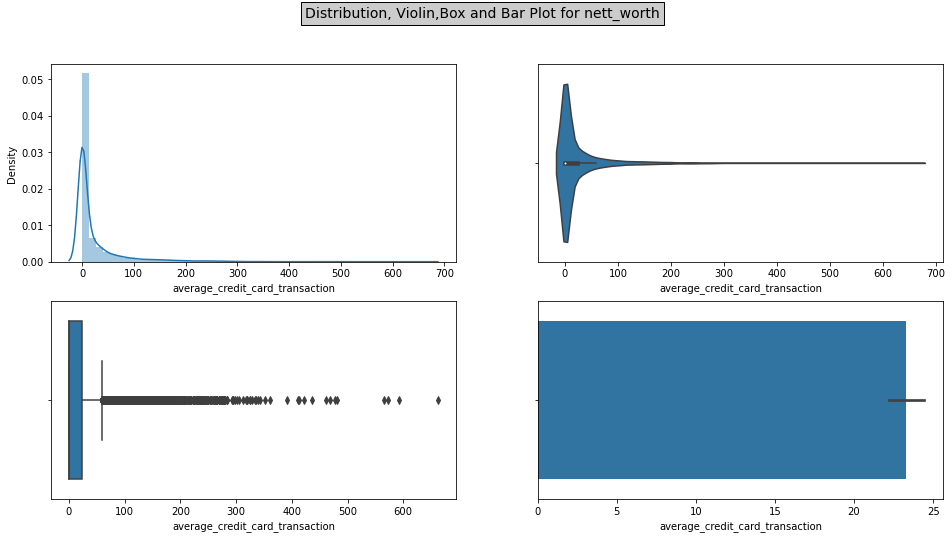

In [256]:
# Your code here
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 8))
plt.suptitle("Distribution, Violin,Box and Bar Plot for nett_worth", bbox={'facecolor':'0.8'},fontsize = 14)
sns.distplot(cc_train_data["average_credit_card_transaction"], ax=axes[0,0])
sns.violinplot(x="average_credit_card_transaction", data=cc_train_data, ax=axes[0,1])
sns.boxplot(x="average_credit_card_transaction", data=cc_train_data, ax=axes[1,0])
sns.barplot(x="average_credit_card_transaction", data=cc_train_data, ax=axes[1,1])

In [257]:
print(" Training data shape",cc_train_data2.shape)
print(" Test Data shape", cc_test_data2.shape)

 Training data shape (8124, 22)
 Test Data shape (2031, 21)


In [258]:
cc_train_data2['children'].unique()

array(['2', 'Zero', '1', '3', '4+'], dtype=object)

In [259]:
cc_test_data2['children'].unique()

array(['Zero', '1', '2', '3', '4+'], dtype=object)

In [260]:
cc_train_data2['children'] = cc_train_data2['children'].replace('Zero',0)
cc_train_data2['children'] = cc_train_data2['children'].replace('4+',5)


In [261]:
cc_test_data2['children'] = cc_test_data2['children'].replace('Zero',0)
cc_test_data2['children'] = cc_test_data2['children'].replace('4+',5)

In [262]:
cc_train_data2['children'] = cc_train_data2['children'].astype(int)

In [263]:
cc_test_data2['children'] = cc_test_data2['children'].astype(int)

In [264]:
cc_train_data2['family_income'].unique()

array(['>=35,000', '<22,500, >=20,000', '<25,000, >=22,500',
       '<30,000, >=27,500', '<20,000, >=17,500', '<27,500, >=25,000',
       '< 4,000', '<15,000, >=12,500', '<17,500, >=15,000',
       '< 8,000, >= 4,000', '<12,500, >=10,000', '<10,000, >= 8,000',
       'Unknown'], dtype=object)

In [265]:
cc_test_data2['family_income'].unique()

array(['<12,500, >=10,000', '>=35,000', '<15,000, >=12,500',
       '<17,500, >=15,000', '< 4,000', '<22,500, >=20,000',
       '<20,000, >=17,500', '<10,000, >= 8,000', 'Unknown',
       '<30,000, >=27,500', '< 8,000, >= 4,000', '<27,500, >=25,000',
       '<25,000, >=22,500'], dtype=object)

In [266]:
cc_train_data2['family_income'] = cc_train_data2['family_income'].replace('Unknown', '< 4,000')

In [267]:
cc_train_data2['region'].value_counts()

South East          1680
North West          1517
Unknown              866
South West           769
West Midlands        658
East Midlands        623
Scotland             615
North                460
Wales                437
East Anglia          344
Northern Ireland     135
Isle of Man           15
Channel Islands        5
Name: region, dtype: int64

In [268]:
cc_train_data2['post_code'].nunique()

8050

In [269]:
cc_train_data2['post_area'].nunique()

1937

In [270]:
cc_train_data2['tvarea'].value_counts()

Central          1294
Carlton          1237
Meridian          977
Yorkshire         847
Granada           824
HTV               683
Anglia            597
Tyne Tees         433
Scottish TV       406
TV South West     286
Grampian          175
Unknown           154
Ulster            135
Border             76
Name: tvarea, dtype: int64

In [271]:
cc_train_data2.drop(columns=['tvarea', 'post_code', 'post_area'], axis = 1, inplace = True)

In [272]:
cc_test_data2.drop(columns=['tvarea', 'post_code', 'post_area'], axis = 1, inplace = True)

In [273]:
print("Train data shape",cc_train_data2.shape)
print("Test data shape",cc_test_data2.shape)

Train data shape (8124, 19)
Test data shape (2031, 18)


In [274]:
cc_train = cc_train_data2.copy()
cc_test = cc_test_data2.copy()

Text(0.5, 0.98, 'Boxplot  for family income Vs nett worth ')

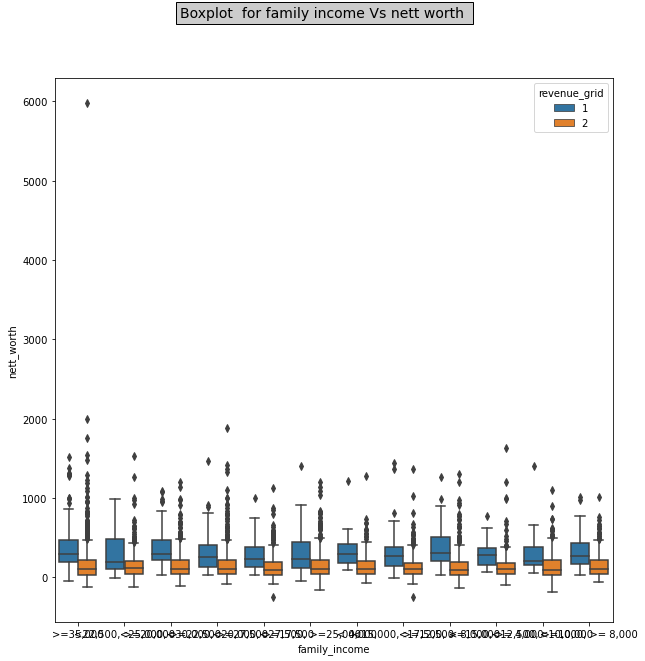

In [275]:
plt.figure(figsize=(10, 10))
sns.boxplot(data = cc_train_data2, x= 'family_income', y = 'nett_worth', hue ='revenue_grid')
#plt.xlabel(xrot=90)
plt.suptitle("Boxplot  for family income Vs nett worth ", bbox={'facecolor':'0.8'},fontsize = 14)

Text(0.5, 0.98, 'Scatter Plot for average ac balance Vs nett worth ')

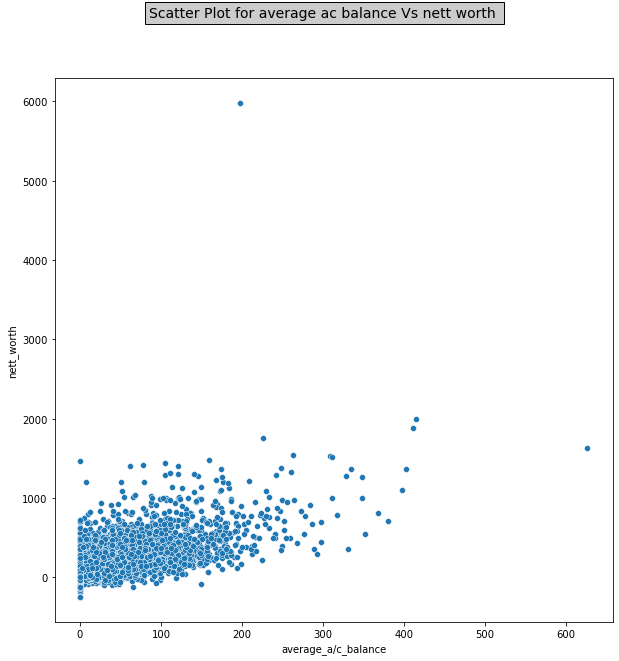

In [276]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data = cc_train_data2, x= 'average_a/c_balance', y ='nett_worth')
plt.suptitle("Scatter Plot for average ac balance Vs nett worth ", bbox={'facecolor':'0.8'},fontsize = 14)

In [277]:
nf_cust = cc_train_data2.select_dtypes(exclude='object')
nf_cust_cols = nf_cust.columns.tolist()
#nf_cust = cc_train_data2.select_dtypes(include=[np.number]).columns
print(nf_cust_cols)
print(len(nf_cust_cols))

['children', 'year_last_moved', 'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance', 'online_purchase_amount', 'revenue_grid', 'total_insurance', 'nett_worth']
9


In [278]:
cf_cust = cc_train_data2.select_dtypes(include='object')
cf_cust_cols = cf_cust.columns.tolist()
#cf_cust = cc_train_data2.select_dtypes(include=[np.object]).columns
print(cf_cust_cols)
print(len(cf_cust_cols))

['age_band', 'status', 'occupation', 'occupation_partner', 'home_status', 'family_income', 'self_employed', 'self_employed_partner', 'gender', 'region']
10


In [279]:
cc_train_data2.head(5)

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,26.98,29.99,108.85,7.68,Female,North West,2,388.51,329.94
9091,0,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.48,48.45,18.99,Female,North West,2,110.95,160.65
9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,0.00,24.46,0.00,0.00,Female,South West,2,18.44,40.09
10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,44.99,0.00,0.00,0.00,Female,Scotland,2,29.99,88.98
1987,0,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,0.00,0.00,0.00,0.00,Female,Unknown,2,0.00,15.18


Text(0.5, 1.0, 'Box and Whisker Plot')

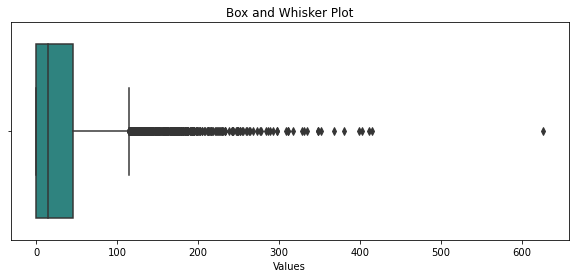

In [280]:
plt.figure(figsize=(10, 4))
sns.boxplot(cc_train_data2['average_a/c_balance'], palette='viridis')
plt.xlabel('Values')
plt.title('Box and Whisker Plot')

In [281]:
nf_list = ['year_last_moved', 'average_credit_card_transaction', 'balance_transfer',
       'average_a/c_balance', 'online_purchase_amount','total_insurance', 'nett_worth']

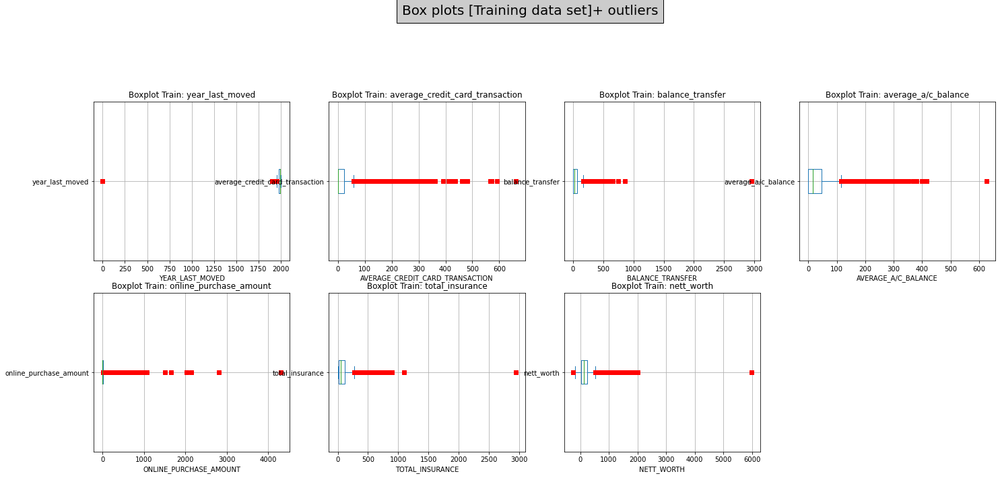

In [282]:
fig = plt.figure(figsize=(24, 20))
fig.suptitle('Box plots [Training data set]+ outliers',
             bbox={'facecolor': '0.8', 'pad': 8}, fontsize=20)
# Plotting box chart for each predictor vs the target variable
for predictor in nf_list:
    ctrain_o = nf_list.index(predictor)
    # print(cntss)
    subsc = fig.add_subplot(4, 4, ctrain_o+1)
    subsc.set_xlabel(predictor.upper())
    # sns.boxplot(y=cc_train_data2[predictor])
    cc_train_data2[predictor].plot.box(
        grid=True, layout=(4, 2), vert=False, sym='rs')
    #cc_train_data2[predictor].plot.box(title="Box and whisker plot [Training data set]+ outliers", grid=True, layout=(4, 2), vert = False, sym='rs')
    # plt.show(block=True)
    subsc.title.set_text('Boxplot Train: ' + str(predictor))

In [283]:
# For training  data 

for c in nf_list:
    #print(c)    
    Q1 = cc_train_data2[c].quantile(0.25)
    Q3 = cc_train_data2[c].quantile(0.75)   
    IQR = Q3-Q1
    upper = Q3+1.5*IQR    
    lower = Q1-1.5*IQR
    print('Percentiles: 25th(Q1)=%.3f, 75th(Q3)=%.3f, IQR=%.3f' % (Q1, Q1, IQR))
    # Identify outliers
    outliers = [x for x in cc_train_data2[c] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))
    #print(cc_train_data2[c])         
    cc_train_data2[c][cc_train_data2[c]>=upper]=upper
    cc_train_data2[c][cc_train_data2[c]<=lower]=lower

Percentiles: 25th(Q1)=1978.000, 75th(Q3)=1978.000, IQR=16.000
Identified outliers: 203
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=23.480
Identified outliers: 1046
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=64.990
Identified outliers: 573
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=45.922
Identified outliers: 459
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=7.480
Identified outliers: 1472
Percentiles: 25th(Q1)=13.990, 75th(Q3)=13.990, IQR=101.845
Identified outliers: 473
Percentiles: 25th(Q1)=43.793, 75th(Q3)=43.793, IQR=189.920
Identified outliers: 439


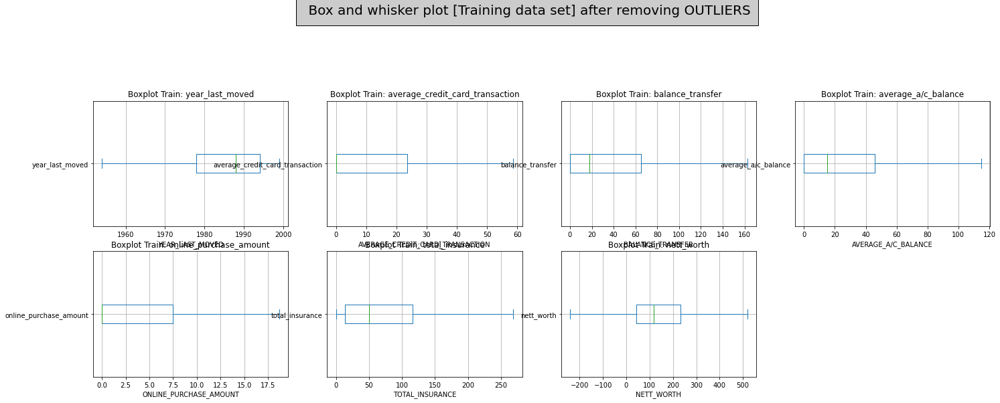

In [284]:
nf_list = ['year_last_moved', 'average_credit_card_transaction', 'balance_transfer',
       'average_a/c_balance', 'online_purchase_amount', 'total_insurance', 'nett_worth']
fig = plt.figure(figsize=(24, 20))
fig.suptitle(' Box and whisker plot [Training data set] after removing OUTLIERS', bbox={'facecolor':'0.8', 'pad':12}, fontsize = 20)
# Plotting scatter chart for each predictor vs the target variable
for predictor in nf_list:
    ctrain = nf_list.index(predictor)    
    #print(cntss)    
    subsc = fig.add_subplot(5, 4, ctrain+1)    
    subsc.set_xlabel(predictor.upper()) 
    #sns.boxplot(y=cc_train_data2[predictor])
    cc_train_data2[predictor].plot.box(grid=True, layout=(4, 2), vert = False, sym='rs')
    #plt.show(block=True)
    subsc.title.set_text('Boxplot Train: '+ str(predictor))  

In [285]:
# For testing   data 
for c in nf_list:
    #print(c)    
    Q1 = cc_test_data2[c].quantile(0.25)
    Q3 = cc_test_data2[c].quantile(0.75)   
    IQR = Q3-Q1
    upper = Q3+1.5*IQR    
    lower = Q1-1.5*IQR
    print('Percentiles: 25th(Q1)=%.3f, 75th(Q3)=%.3f, IQR=%.3f' % (Q1, Q1, IQR))
    # Identify outliers
    outliers = [x for x in cc_test_data2[c] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))
    #print(cc_test_data2[c])         
    cc_test_data2[c][cc_test_data2[c]>=upper]=upper
    cc_test_data2[c][cc_test_data2[c]<=lower]=lower

Percentiles: 25th(Q1)=1979.000, 75th(Q3)=1979.000, IQR=15.000
Identified outliers: 61
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=24.490
Identified outliers: 268
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=69.710
Identified outliers: 134
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=48.950
Identified outliers: 93
Percentiles: 25th(Q1)=0.000, 75th(Q3)=0.000, IQR=8.985
Identified outliers: 327
Percentiles: 25th(Q1)=14.995, 75th(Q3)=14.995, IQR=110.365
Identified outliers: 110
Percentiles: 25th(Q1)=45.150, 75th(Q3)=45.150, IQR=203.695
Identified outliers: 112


In [286]:
cc_train2 = cc_train_data2.copy
cc_test2 = cc_test_data2.copy

In [287]:
print("Training data", cc_train_data2.shape)
print("Testing data", cc_test_data2.shape)

Training data (8124, 19)
Testing data (2031, 18)


<AxesSubplot:xlabel='total_insurance', ylabel='nett_worth'>

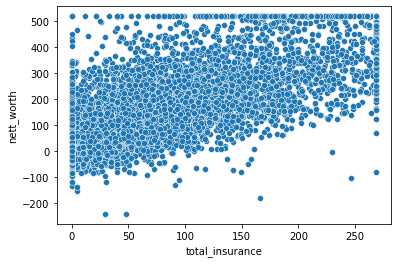

In [288]:
X = cc_train_data2['total_insurance'].values.reshape((-1, 1))
y = cc_train_data2['nett_worth'].values
sns.scatterplot(data = cc_train_data2, x= 'total_insurance', y ='nett_worth')

In [289]:
cc_train_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,26.98,29.99,108.85,7.68,Female,North West,2,268.603,329.94
9091,0,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.48,48.45,18.70,Female,North West,2,110.950,160.65
9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,0.00,24.46,0.00,0.00,Female,South West,2,18.440,40.09
10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,44.99,0.00,0.00,0.00,Female,Scotland,2,29.990,88.98
1987,0,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,0.00,0.00,0.00,0.00,Female,Unknown,2,0.000,15.18


In [290]:
cc_train_data2.loc[cc_train_data2['occupation_partner'] == "Unknown"]["gender"].value_counts(normalize=True)

Female     0.796
Male       0.200
Unknown    0.004
Name: gender, dtype: float64

In [291]:
cc_train_data2.loc[cc_train_data2['occupation_partner'] == "Unknown"]["revenue_grid"]

ref_no
7151     2
1784     2
7554     2
4499     2
2756     1
10324    2
10681    2
4762     2
7001     2
3799     2
3572     2
3290     2
8450     2
5960     2
11289    2
7456     2
4983     2
6896     2
4579     2
2991     2
1691     2
9178     1
7980     2
7395     2
7785     2
6208     2
11228    2
7786     2
20       2
2162     1
5642     2
1241     2
2195     2
10728    2
7497     2
7875     2
10983    1
920      1
5592     2
7635     2
10486    2
7244     1
1683     2
10575    2
4882     2
4024     2
2895     2
6083     2
6544     2
2578     2
433      2
8576     2
8222     2
125      2
10275    2
2455     1
2198     2
2433     2
5236     2
4391     2
10483    2
7256     2
6836     2
6241     2
2768     1
8041     2
1941     2
7013     2
1842     2
3744     2
9613     2
9609     2
6711     2
2540     2
1828     2
6487     2
8880     2
5866     2
10300    1
3230     2
6091     2
11103    2
8376     2
11468    2
5718     2
7762     1
9359     2
462      2
5576     2
10971    2
510

<AxesSubplot:>

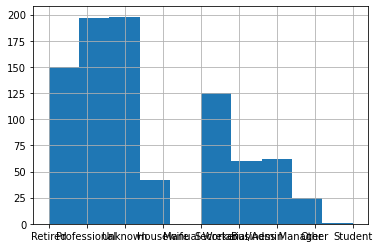

In [292]:
cc_train_data2.loc[cc_train_data2['revenue_grid'] == 1]["occupation_partner"].hist()

In [293]:
cc_train_data2['nett_worth'].nlargest()

ref_no
6892    518.592
9011    518.592
8450    518.592
1691    518.592
5832    518.592
Name: nett_worth, dtype: float64

In [294]:
cc_train_data2['nett_worth'].nsmallest()

ref_no
7563   -241.087
8714   -241.087
7676   -180.670
2301   -153.560
8170   -136.210
Name: nett_worth, dtype: float64

In [295]:
cc_train_data2.loc[cc_train_data2.nett_worth > 480,'region'].tolist()

['East Midlands',
 'Unknown',
 'West Midlands',
 'West Midlands',
 'North West',
 'East Midlands',
 'Northern Ireland',
 'East Midlands',
 'South East',
 'East Midlands',
 'Scotland',
 'Scotland',
 'West Midlands',
 'South East',
 'South East',
 'East Midlands',
 'North West',
 'East Anglia',
 'West Midlands',
 'South East',
 'North West',
 'South East',
 'Unknown',
 'North West',
 'West Midlands',
 'South East',
 'Scotland',
 'Unknown',
 'Unknown',
 'South East',
 'South West',
 'North West',
 'Northern Ireland',
 'South East',
 'North West',
 'East Midlands',
 'East Anglia',
 'Unknown',
 'North',
 'South East',
 'East Midlands',
 'North',
 'South East',
 'West Midlands',
 'North West',
 'North West',
 'West Midlands',
 'North West',
 'East Anglia',
 'South East',
 'North West',
 'Wales',
 'North West',
 'North West',
 'South East',
 'South East',
 'South East',
 'South East',
 'Scotland',
 'North West',
 'South West',
 'South East',
 'South West',
 'Scotland',
 'Unknown',
 'East Angl

In [296]:
cc_train_data2.groupby('occupation_partner')['nett_worth'].nlargest(2)

occupation_partner  ref_no
Business Manager    2823      518.592
                    4994      518.592
Housewife           9011      518.592
                    7662      518.592
Manual Worker       10932     518.592
                    8500      518.592
Other               6996      518.592
                    8497      518.592
Professional        5832      518.592
                    8737      518.592
Retired             6892      518.592
                    10455     518.592
Secretarial/Admin   612       518.592
                    7449      518.592
Student             3372      518.592
                    6702      295.650
Unknown             8450      518.592
                    1691      518.592
Name: nett_worth, dtype: float64

In [297]:
cc_train_data2.groupby('home_status')['nett_worth'].count()

home_status
Live in Parental Hom      90
Own Home                7506
Rent Privately           205
Rent from Council/HA     279
Unclassified              44
Name: nett_worth, dtype: int64

In [298]:
cc_train_data2.loc[(cc_train_data2['home_status'] == 'Unclassified') & (cc_train_data2['nett_worth'] > 100)].agg({'min', 'max', 'count'})

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
min,0,18-21,Partner,Business Manager,Business Manager,Unclassified,"< 4,000",No,No,1954,0.0,0.000,0.000,0.0,Female,East Anglia,1,0.000,108.820
max,2,Unknown,Unknown,Unknown,Unknown,Unclassified,"<20,000, >=17,500",No,No,1999,58.7,162.475,114.806,18.7,Male,West Midlands,2,268.603,518.592
count,24,24,24,24,24,24,24,24,24,24,24.0,24.000,24.000,24.0,24,24,24,24.000,24.000


What percentage of people own a home?

In [299]:
cc_train_data2.loc[cc_train_data2['nett_worth'] > 600][['region','gender','nett_worth','family_income']]

,region,gender,nett_worth,family_income
ref_no,,,,


In [300]:
cc_train_data2.loc[(cc_train_data2['region'] == 'Unknown') & (cc_train_data2['nett_worth'] > 100)].agg({'min', 'max', 'count'})

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
min,0,18-21,Divorced/Separated,Business Manager,Business Manager,Live in Parental Hom,"< 4,000",No,No,1954,0.0,0.000,0.000,0.0,Female,Unknown,1,0.000,100.310
max,3,Unknown,Widowed,Unknown,Unknown,Unclassified,">=35,000",Yes,Yes,1999,58.7,162.475,114.806,18.7,Unknown,Unknown,2,268.603,518.592
count,478,478,478,478,478,478,478,478,478,478,478.0,478.000,478.000,478.0,478,478,478,478.000,478.000


In [301]:
cc_train_data2['average_a/c_balance'].describe()

count    8124.000
mean       28.945
std        34.986
min         0.000
25%         0.000
50%        14.980
75%        45.922
max       114.806
Name: average_a/c_balance, dtype: float64

In [302]:
cc_train_data2[cc_train_data2['average_a/c_balance'] > 45]

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,26.98,29.990,108.850,7.68,Female,North West,2,268.603,329.940
9091,0,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.480,48.450,18.70,Female,North West,2,110.950,160.650
8648,0,65-70,Partner,Retired,Retired,Own Home,"< 4,000",No,No,1954,58.70,162.475,114.806,0.00,Female,North West,2,120.330,164.560
10231,0,41-45,Partner,Professional,Professional,Own Home,">=35,000",No,No,1986,0.00,0.000,48.960,0.00,Male,South East,2,103.920,179.650
6892,0,65-70,Partner,Retired,Retired,Own Home,"<30,000, >=27,500",No,No,1971,0.00,29.990,62.890,0.00,Male,East Midlands,1,268.603,518.592
5342,0,65-70,Partner,Retired,Retired,Own Home,"<17,500, >=15,000",No,No,1986,0.00,139.970,48.920,18.70,Female,North,2,215.840,344.220
7554,2,26-30,Partner,Professional,Unknown,Own Home,"<25,000, >=22,500",No,No,1991,35.97,0.010,106.800,0.00,Female,Unknown,2,99.360,487.430
2756,0,65-70,Partner,Unknown,Unknown,Own Home,"< 8,000, >= 4,000",No,No,1954,58.70,0.000,114.806,18.70,Female,South East,1,118.910,318.210
9011,0,51-55,Partner,Retired,Housewife,Own Home,"<20,000, >=17,500",Yes,Yes,1970,58.70,134.960,66.440,18.70,Male,West Midlands,2,268.603,518.592


region
Channel Islands     AxesSubplot(0.125,0.125;0.775x0.755)
East Anglia         AxesSubplot(0.125,0.125;0.775x0.755)
East Midlands       AxesSubplot(0.125,0.125;0.775x0.755)
Isle of Man         AxesSubplot(0.125,0.125;0.775x0.755)
North               AxesSubplot(0.125,0.125;0.775x0.755)
North West          AxesSubplot(0.125,0.125;0.775x0.755)
Northern Ireland    AxesSubplot(0.125,0.125;0.775x0.755)
Scotland            AxesSubplot(0.125,0.125;0.775x0.755)
South East          AxesSubplot(0.125,0.125;0.775x0.755)
South West          AxesSubplot(0.125,0.125;0.775x0.755)
Unknown             AxesSubplot(0.125,0.125;0.775x0.755)
Wales               AxesSubplot(0.125,0.125;0.775x0.755)
West Midlands       AxesSubplot(0.125,0.125;0.775x0.755)
Name: nett_worth, dtype: object

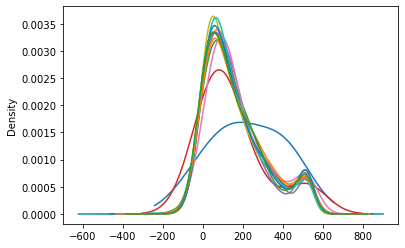

In [303]:
cc_train_data2.groupby('region')['nett_worth'].plot(kind='kde')

<AxesSubplot:ylabel='Frequency'>

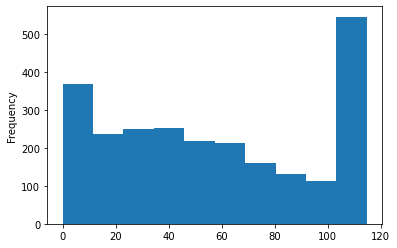

In [304]:
cc_train_data2['average_a/c_balance'][cc_train_data2['nett_worth'] >= 200].plot(kind='hist')

In [305]:
cc_train_data2['nett_worth'].nlargest(10)

ref_no
6892     518.592
9011     518.592
8450     518.592
1691     518.592
5832     518.592
10932    518.592
10983    518.592
6996     518.592
6083     518.592
8500     518.592
Name: nett_worth, dtype: float64

In [306]:
cc_train_data2[cc_train_data2['nett_worth'] <= 708.85]['region']

ref_no
5466           North West
9091           North West
9744           South West
10700            Scotland
1987              Unknown
3309     Northern Ireland
6610        West Midlands
10621          North West
2630              Unknown
9356           North West
8180           North West
8648           North West
10231          South East
6892        East Midlands
7151           North West
1784           South East
5342                North
10031          South East
7554              Unknown
4499          East Anglia
2756           South East
9011        West Midlands
10324          South East
10681       West Midlands
4762             Scotland
7555                Wales
8332           South West
10518       East Midlands
5343           South West
10124         East Anglia
2874           North West
10617          South East
947              Scotland
7643           North West
9152                Wales
7001           North West
9580           South West
3799           South East
3663 

In [307]:
#customer_transaction_data = customer_transaction_data.merge(customer_transaction_data.groupby(['customer_id', 'date']).agg({'coupon_id':'count', 'item_id':'count', 'disc_percent':sum}).reset_index().rename(columns={'coupon_id':'coupon_aquired', 'item_id':'item_bought', 'disc_percent':'tot_disc'}), on=['customer_id', 'date'], how='left')

<AxesSubplot:>

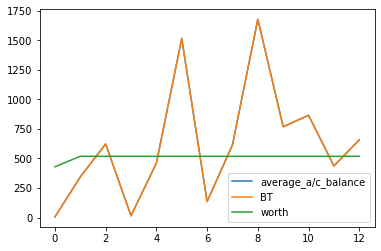

In [308]:
cc_train_data2.groupby(['region']).agg({'average_a/c_balance':'count', 'balance_transfer':'count', 'nett_worth':'max'}).reset_index().rename(columns={'c_balance':'avg_bal', 'balance_transfer':'BT', 'nett_worth':'worth'}).plot()
#cc_train_data2.groupby(['region', 'gender']).agg({'average_a/c_balance':'count', 'balance_transfer':'count', 'nett_worth':'count'}).reset_index().rename(columns={'c_balance':'avg_bal', 'balance_transfer':'BT', 'nett_worth':'worth'})

In [309]:
cc_train_data2['nett_worth'].describe()

count    8124.000
mean      156.743
std       150.121
min      -241.087
25%        43.793
50%       116.955
75%       233.712
max       518.592
Name: nett_worth, dtype: float64

In [310]:
cc_train_data2[(cc_train_data2['children']) == 1 & (cc_train_data2['nett_worth'] > 100)].count()

children                           3256
age_band                           3256
status                             3256
occupation                         3256
occupation_partner                 3256
home_status                        3256
family_income                      3256
self_employed                      3256
self_employed_partner              3256
year_last_moved                    3256
average_credit_card_transaction    3256
balance_transfer                   3256
average_a/c_balance                3256
online_purchase_amount             3256
gender                             3256
region                             3256
revenue_grid                       3256
total_insurance                    3256
nett_worth                         3256
dtype: int64

In [311]:
cc_train_data2[cc_train_data2['children'] == 3]

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
9356,3,36-40,Partner,Professional,Housewife,Own Home,"<27,500, >=25,000",Yes,No,1997,0.00,0.000,0.000,0.00,Male,North West,2,0.000,30.560
8332,3,41-45,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1997,0.00,0.000,0.000,0.00,Female,South West,2,10.490,-10.840
4930,3,31-35,Partner,Professional,Manual Worker,Own Home,"<25,000, >=22,500",No,Yes,1985,0.00,24.990,0.000,0.00,Female,North West,2,14.990,-5.690
9339,3,36-40,Partner,Professional,Business Manager,Own Home,">=35,000",No,No,1991,0.00,0.000,43.460,10.00,Female,Scotland,2,36.480,-35.510
9714,3,41-45,Partner,Housewife,Secretarial/Admin,Own Home,"<25,000, >=22,500",No,No,1991,0.00,39.480,9.490,0.00,Female,North,2,19.980,40.800
7980,3,41-45,Partner,Housewife,Unknown,Own Home,">=35,000",No,Yes,1992,0.00,0.000,81.390,0.00,Female,Northern Ireland,2,90.410,166.580
6097,3,31-35,Partner,Secretarial/Admin,Business Manager,Own Home,">=35,000",No,No,1996,0.00,0.000,13.480,7.98,Female,South West,2,0.000,-18.860
10056,3,26-30,Partner,Unknown,Professional,Own Home,">=35,000",No,Yes,1993,0.00,24.980,19.980,0.00,Female,Scotland,2,24.990,86.020
8555,3,36-40,Partner,Housewife,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1992,6.49,0.000,84.940,18.70,Female,North West,1,140.940,340.170


In [312]:
cc_train_data2['occupation'].value_counts(normalize=True).sort_values()

Student              0.006
Other                0.053
Unknown              0.055
Manual Worker        0.056
Business Manager     0.071
Housewife            0.121
Secretarial/Admin    0.177
Retired              0.221
Professional         0.240
Name: occupation, dtype: float64

In [313]:
cc_train_data2[(cc_train_data2['occupation'] == 'Secretarial/Admin') | (cc_train_data2['occupation'] == 'Admin')]

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
9091,0,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.480,48.450,18.70,Female,North West,2,110.950,160.650
3309,0,45-50,Partner,Secretarial/Admin,Business Manager,Own Home,">=35,000",No,No,1984,9.49,0.010,0.000,0.00,Female,Northern Ireland,2,56.400,36.880
6610,0,36-40,Partner,Secretarial/Admin,Secretarial/Admin,Own Home,"<30,000, >=27,500",Yes,No,1986,9.99,0.000,26.960,5.49,Female,West Midlands,2,0.000,114.940
7151,2,36-40,Divorced/Separated,Secretarial/Admin,Unknown,Rent from Council/HA,"<15,000, >=12,500",No,No,1995,0.00,0.000,0.000,0.00,Female,North West,2,0.000,33.170
4499,0,55-60,Partner,Secretarial/Admin,Unknown,Own Home,"<17,500, >=15,000",No,Yes,1973,0.00,0.000,0.000,18.70,Female,East Anglia,2,0.000,-2.760
4762,0,55-60,Partner,Secretarial/Admin,Unknown,Own Home,"<17,500, >=15,000",No,Yes,1998,0.00,0.000,0.000,0.00,Female,Scotland,2,67.960,4.260
947,0,31-35,Partner,Secretarial/Admin,Manual Worker,Own Home,"<27,500, >=25,000",No,No,1993,0.00,74.380,93.410,0.00,Female,Scotland,2,175.390,220.210
4579,0,55-60,Widowed,Secretarial/Admin,Unknown,Own Home,"<10,000, >= 8,000",No,No,1965,0.00,0.000,43.980,0.00,Female,West Midlands,2,0.000,167.600
6577,0,26-30,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1990,0.00,56.370,65.960,18.70,Female,West Midlands,2,119.310,179.110


In [314]:
cc_train_data2['occupation'].value_counts(normalize=True)

Professional         0.240
Retired              0.221
Secretarial/Admin    0.177
Housewife            0.121
Business Manager     0.071
Manual Worker        0.056
Unknown              0.055
Other                0.053
Student              0.006
Name: occupation, dtype: float64

In [315]:
cc_train_data2['occupation'].unique()

array(['Professional', 'Secretarial/Admin', 'Manual Worker', 'Housewife',
       'Retired', 'Other', 'Unknown', 'Business Manager', 'Student'],
      dtype=object)

In [316]:
cc_train_data2['occupation'] = cc_train_data2['occupation'].replace('Secretarial/Admin','Admin')
cc_train_data2['occupation'] = cc_train_data2['occupation'].replace('Unknown', 'Other')
cc_train_data2['occupation_partner'] = cc_train_data2['occupation_partner'].replace('Unknown', 'Other')
cc_train_data2['occupation_partner'] = cc_train_data2['occupation_partner'].replace('Secretarial/Admin','Admin')

In [317]:
cc_test_data2['occupation_partner'].value_counts(normalize=True)

Unknown              2.226e-01
Professional         2.122e-01
Retired              1.861e-01
Manual Worker        1.408e-01
Business Manager     7.976e-02
Secretarial/Admin    7.484e-02
Housewife            5.170e-02
Other                3.102e-02
Student              9.847e-04
Name: occupation_partner, dtype: float64

In [318]:
cc_test_data2['occupation'] = cc_test_data2['occupation'].replace('Unknown', 'Other')
cc_test_data2['occupation'] = cc_test_data2['occupation'].replace('Secretarial/Admin','Admin')
cc_test_data2['occupation_partner'] = cc_test_data2['occupation_partner'].replace('Unknown', 'Other')
cc_test_data2['occupation_partner'] = cc_test_data2['occupation_partner'].replace('Secretarial/Admin','Admin')

In [319]:
cc_train_data2['gender'].value_counts()

Female     6106
Male       1987
Unknown      31
Name: gender, dtype: int64

In [320]:
cc_train_data2['gender'] = cc_train_data2['gender'].replace('Unknown', 'Male')
cc_train_data2['gender'].value_counts()

Female    6106
Male      2018
Name: gender, dtype: int64

In [321]:
cc_test_data2['gender'] = cc_test_data2['gender'].replace('Unknown', 'Male')
cc_test_data2['gender'].value_counts()

Female    1528
Male       503
Name: gender, dtype: int64

In [322]:
#cc_train_data2[['Team1','Team2']] =  cc_train_data2.Team.str.split("/", expand=True)
#cc_train_data2.head()

In [323]:
cc_train_data2['age_band'].unique()

array(['31-35', '45-50', '36-40', '55-60', '61-65', '65-70', '41-45',
       '51-55', '26-30', '22-25', '71+', 'Unknown', '18-21'], dtype=object)

In [324]:
cc_train_data2['age_band'].value_counts(normalize=True)

45-50      0.135
41-45      0.111
36-40      0.110
55-60      0.106
31-35      0.103
51-55      0.103
26-30      0.090
61-65      0.086
65-70      0.058
22-25      0.044
71+        0.041
18-21      0.006
Unknown    0.005
Name: age_band, dtype: float64

In [325]:
cc_train_data2['age_band'] = cc_train_data2['age_band'].replace('71+', '71-91')
cc_train_data2['age_band'] = cc_train_data2['age_band'].replace('Unknown', '71-91')

In [326]:
cc_test_data2['age_band'] = cc_test_data2['age_band'].replace('71+', '71-91')
cc_test_data2['age_band'] = cc_test_data2['age_band'].replace('Unknown', '71-91')

<AxesSubplot:>

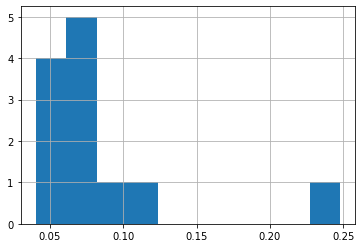

In [327]:
cc_train_data2['family_income'].value_counts(normalize=True).hist()

In [328]:
cc_train_data2['status'].unique()

array(['Partner', 'Divorced/Separated', 'Single/Never Married', 'Widowed',
       'Unknown'], dtype=object)

In [329]:
cc_train_data2['status'] = cc_train_data2['status'].replace('Divorced', 'Single')
cc_train_data2['status'] = cc_train_data2['status'].replace('Widowed', 'Single')
cc_train_data2['status'] = cc_train_data2['status'].replace('Unknown', 'Single')
cc_train_data2['status'] = cc_train_data2['status'].replace('Single/Never Married', 'Single')
cc_train_data2['status'] = cc_train_data2['status'].replace('Divorced/Separated', 'Single')

In [330]:
cc_test_data2['status'] = cc_test_data2['status'].replace('Single/Never Married', 'Single')
cc_test_data2['status'] = cc_test_data2['status'].replace('Divorced/Separated', 'Single')

In [331]:
cc_test_data2['status'] = cc_test_data2['status'].replace('Divorced', 'Single')
cc_test_data2['status'] = cc_test_data2['status'].replace('Widowed', 'Single')
cc_test_data2['status'] = cc_test_data2['status'].replace('Unknown', 'Single')

In [332]:
cc_train_data2['status'].value_counts()

Partner    6124
Single     2000
Name: status, dtype: int64

In [333]:
cc_test_data2['status'].value_counts()

Partner    1585
Single      446
Name: status, dtype: int64

In [334]:
#df['A'].map({1:'a', 2:'b', 3:'c'}))
cc_train_data2['status'] = cc_train_data2['status'].map({'Single':'0', 'Partner':'1'})

In [335]:
#df['A'].map({1:'a', 2:'b', 3:'c'}))
cc_test_data2['status'] = cc_test_data2['status'].map({'Single':'0', 'Partner':'1'})

In [336]:
cc_train_data2['status'].dtype

dtype('O')

In [337]:
cc_train_data2['home_status'].unique()

array(['Own Home', 'Rent Privately', 'Rent from Council/HA',
       'Live in Parental Hom', 'Unclassified'], dtype=object)

In [338]:
cc_train_data2['home_status'] = cc_train_data2['home_status'].replace('Rent from Council/HA', 'Rent')
cc_train_data2['home_status'] = cc_train_data2['home_status'].replace('Rent Privately', 'Rent')
cc_train_data2['home_status'] = cc_train_data2['home_status'].replace('Live in Parental Hom','Own Home')

In [339]:
cc_test_data2['home_status'] = cc_test_data2['home_status'].replace('Rent from Council/HA', 'Rent')
cc_test_data2['home_status'] = cc_test_data2['home_status'].replace('Rent Privately', 'Rent')
cc_test_data2['home_status'] = cc_test_data2['home_status'].replace('Live in Parental Hom','Own Home')

In [340]:
cc_train_data2['children'].unique()

array([2, 0, 1, 3, 5])

In [341]:
cc_train_data2['region'].value_counts()

South East          1680
North West          1517
Unknown              866
South West           769
West Midlands        658
East Midlands        623
Scotland             615
North                460
Wales                437
East Anglia          344
Northern Ireland     135
Isle of Man           15
Channel Islands        5
Name: region, dtype: int64

In [342]:
cc_train_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,31-35,1,Professional,Professional,Own Home,">=35,000",No,No,1981,26.98,29.99,108.85,7.68,Female,North West,2,268.603,329.94
9091,0,45-50,1,Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.48,48.45,18.70,Female,North West,2,110.950,160.65
9744,1,36-40,1,Manual Worker,Manual Worker,Rent,"<22,500, >=20,000",Yes,Yes,1996,0.00,24.46,0.00,0.00,Female,South West,2,18.440,40.09
10700,2,31-35,1,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,44.99,0.00,0.00,0.00,Female,Scotland,2,29.990,88.98
1987,0,55-60,1,Housewife,Professional,Own Home,">=35,000",No,No,1989,0.00,0.00,0.00,0.00,Female,Unknown,2,0.000,15.18


In [343]:
cc_train_data2.describe()

,children,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,revenue_grid,total_insurance,nett_worth
count,8124.000,8124.000,8124.000,8124.000,8124.000,8124.000,8124.000,8124.000,8124.000
mean,0.641,1984.772,13.865,39.984,28.945,4.430,1.894,76.951,156.743
std,0.923,11.512,21.483,52.900,34.986,7.486,0.308,79.267,150.121
min,0.000,1954.000,0.000,0.000,0.000,0.000,1.000,0.000,-241.087
25%,0.000,1978.000,0.000,0.000,0.000,0.000,2.000,13.990,43.793
50%,0.000,1988.000,0.000,17.485,14.980,0.000,2.000,49.970,116.955
75%,1.000,1994.000,23.480,64.990,45.922,7.480,2.000,115.835,233.712
max,5.000,1999.000,58.700,162.475,114.806,18.700,2.000,268.603,518.592


<a name = Section6></a>

---
#  Exploratory Data Analysis
---

In [344]:
df3 = pd.crosstab([cc_train_data2.gender, cc_train_data2.family_income], cc_train_data2.region,  margins=True)
print(df3)

region                    Channel Islands  East Anglia  East Midlands  Isle of Man  North  \
gender family_income                                                                        
Female < 4,000                          1           13             21            2     25   
       < 8,000, >= 4,000                0           12             24            0     23   
       <10,000, >= 8,000                1           14             33            0     22   
       <12,500, >=10,000                0           18             27            0     34   
       <15,000, >=12,500                1           11             35            1     23   
       <17,500, >=15,000                0           13             39            0     29   
       <20,000, >=17,500                0           16             31            1     26   
       <22,500, >=20,000                0           23             31            1     23   
       <25,000, >=22,500                0           23             27 

In [345]:
df_nett = cc_train_data2['family_income'].where(cc_train_data2['average_a/c_balance'] > 100)
df_nett.describe()

count          646
unique          12
top       >=35,000
freq           172
Name: family_income, dtype: object

In [346]:
df_region = cc_train_data2['region'].where(cc_train_data2['average_credit_card_transaction'] > 50)
df_region.describe()

count           1175
unique            12
top       South East
freq             258
Name: region, dtype: object

<AxesSubplot:xlabel='average_credit_card_transaction', ylabel='online_purchase_amount'>

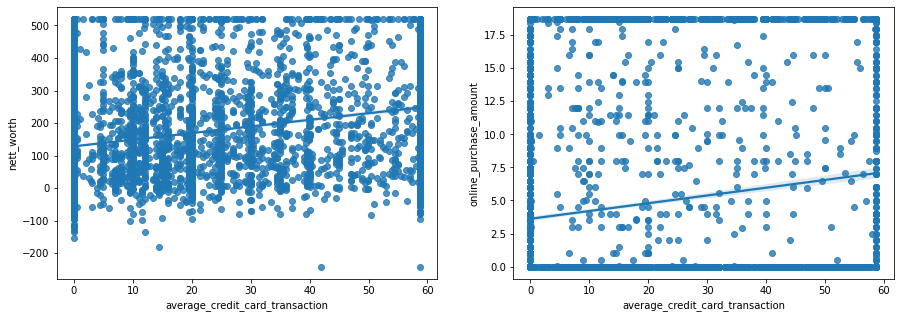

In [347]:
ig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Distance per Minutes given kind of Activity')

sns.regplot(data = cc_train_data2, x = 'average_credit_card_transaction', y = 'nett_worth', ax=axes[0])
sns.regplot(data = cc_train_data2, x = 'average_credit_card_transaction', y = 'online_purchase_amount', ax=axes[1])
#sns.regplot(data = cc_train_data2, x = 'online_purchase_amount', y = 'family_income', ax=axes[2])
#sns.regplot(data = cc_train_data2, x = 'nett_worth', y = 'average_a/c_balance', ax=axes[3])

In [348]:
cc_train_data2['average_credit_card_transaction'].describe()

count    8124.000
mean       13.865
std        21.483
min         0.000
25%         0.000
50%         0.000
75%        23.480
max        58.700
Name: average_credit_card_transaction, dtype: float64

<AxesSubplot:ylabel='Frequency'>

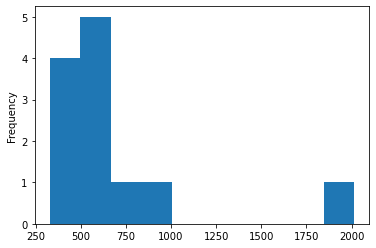

In [349]:
cc_train_data2["family_income"].value_counts().plot(kind='hist')

<AxesSubplot:ylabel='Frequency'>

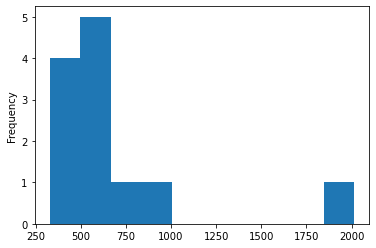

In [350]:
cc_train_data2["family_income"].value_counts().plot(kind='hist')

In [351]:
for (region, group) in cc_train_data2.groupby('region'):
    print("{0:30s} shape={1}".format(region, group.shape))
    #print("{0:30f} shape={1}".format(region, group.shape)) # since float value is passed

Channel Islands                shape=(5, 19)
East Anglia                    shape=(344, 19)
East Midlands                  shape=(623, 19)
Isle of Man                    shape=(15, 19)
North                          shape=(460, 19)
North West                     shape=(1517, 19)
Northern Ireland               shape=(135, 19)
Scotland                       shape=(615, 19)
South East                     shape=(1680, 19)
South West                     shape=(769, 19)
Unknown                        shape=(866, 19)
Wales                          shape=(437, 19)
West Midlands                  shape=(658, 19)


Text(0.5, 0.98, 'Histogram Plot')

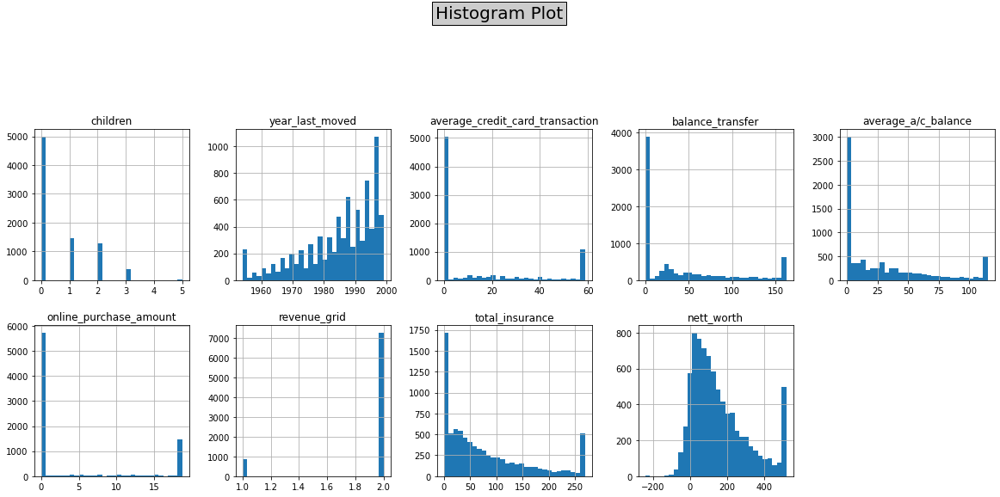

In [352]:
cc_train_data2.hist(figsize=(20,20), grid=True, layout=(5,5), bins = 30)
plt.suptitle("Histogram Plot", bbox={'facecolor':'0.8'},fontsize = 20)

#### **Question:** What is the distribution of the **target** feature?



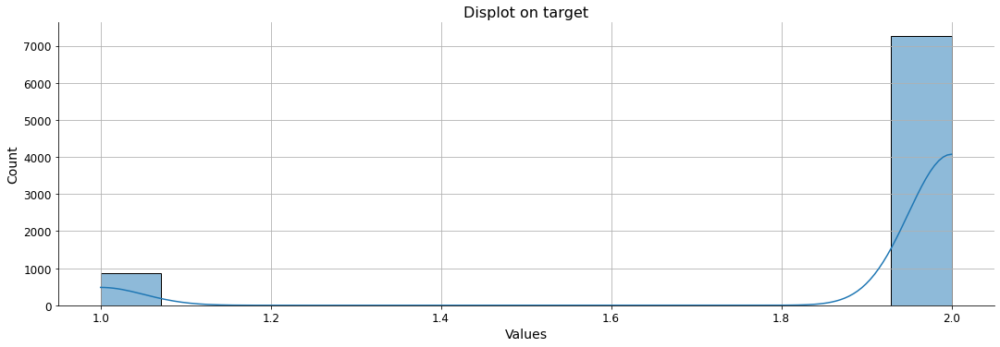

In [353]:
# Plot a displot on target variable
sns.displot(x='revenue_grid', data=cc_train_data2, kde=True, aspect=3)
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel(xlabel='Values', size=14)
plt.ylabel(ylabel='Count', size=14)
plt.title(label='Displot on target', size=16)
plt.grid(b=True)

# Display the plot
plt.show()

**Observations**:

- This seems to be a highly skewed target variable.

- Let's take the **log** transform of it to check the distribution.

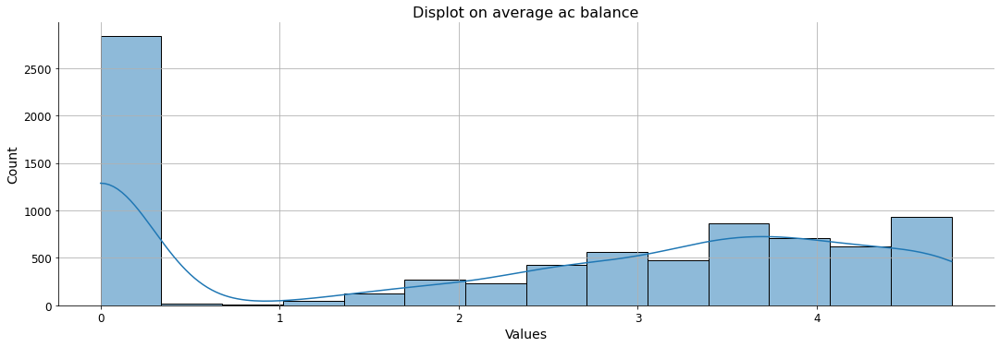

In [354]:
# Plot a displot on target variable
# np.log1p calculates the natural log(1 + x) of the value
sns.displot(x=np.log1p(cc_train_data2['average_a/c_balance']), kde=True, aspect=3)

# Add some cosmetics
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel(xlabel='Values', size=14)
plt.ylabel(ylabel='Count', size=14)
plt.title(label='Displot on average ac balance', size=16)
plt.grid(b=True)

# Display the plot
plt.show()

**Observations**:

- Better distributed now!

- Let's check the **information** for **target** feature after taking the log.

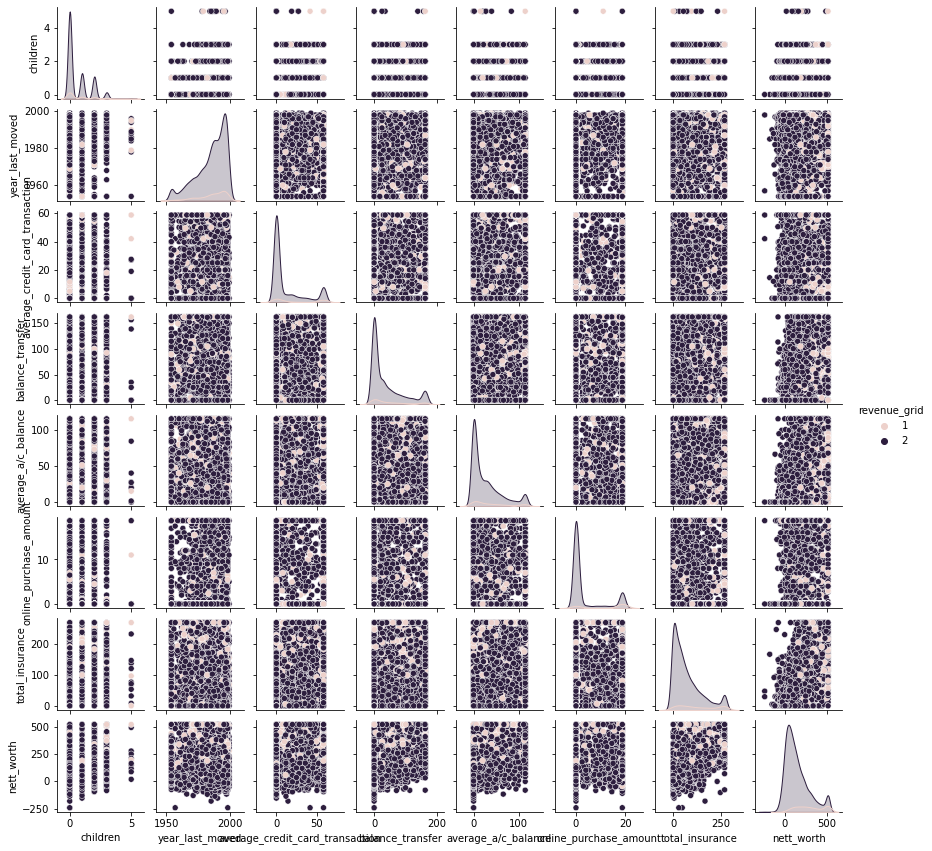

In [355]:
sns.pairplot(cc_train_data2, hue='revenue_grid', size=1.5);

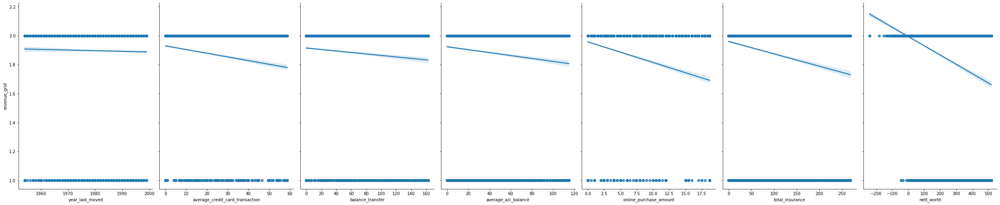

In [356]:
sns.pairplot(cc_train_data2, x_vars=['year_last_moved', 'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
            'online_purchase_amount', 'total_insurance', 'nett_worth'], y_vars='revenue_grid', height=7, aspect=0.7, kind='reg')
#sns.pairplot(cc_train_data2, x_vars=[0,1,2,3], y_vars=4, height=7, aspect=0.7, kind='reg')

In [357]:
cc_train_data2.columns

Index(['children', 'age_band', 'status', 'occupation', 'occupation_partner', 'home_status',
       'family_income', 'self_employed', 'self_employed_partner', 'year_last_moved',
       'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
       'online_purchase_amount', 'gender', 'region', 'revenue_grid', 'total_insurance',
       'nett_worth'],
      dtype='object')

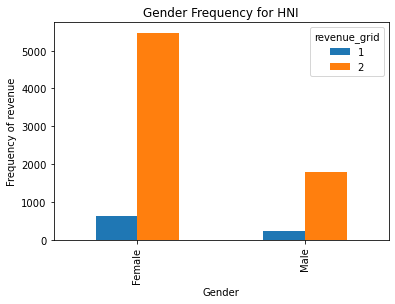

In [358]:
pd.crosstab(cc_train_data2.gender,cc_train_data2["revenue_grid"])[0:150].plot(kind='bar')
plt.title('Gender Frequency for HNI')
plt.xlabel('Gender')
plt.ylabel('Frequency of revenue')
plt.show()

From which region are the HNI?

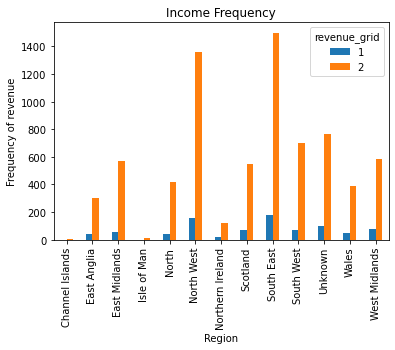

In [359]:
pd.crosstab(cc_train_data2.region,cc_train_data2["revenue_grid"]).plot(kind='bar')
plt.title('Income Frequency')
plt.xlabel('Region')
plt.ylabel('Frequency of revenue')
plt.show()

In [360]:
cc_train_data2.columns

Index(['children', 'age_band', 'status', 'occupation', 'occupation_partner', 'home_status',
       'family_income', 'self_employed', 'self_employed_partner', 'year_last_moved',
       'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
       'online_purchase_amount', 'gender', 'region', 'revenue_grid', 'total_insurance',
       'nett_worth'],
      dtype='object')

What is the distribution of credit card transactions per group ?

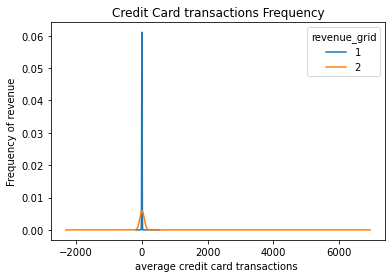

In [361]:
pd.crosstab(cc_train_data2.average_credit_card_transaction,cc_train_data2["revenue_grid"]).plot(kind='kde')
plt.title('Credit Card transactions Frequency')
plt.xlabel('average credit card transactions ')
plt.ylabel('Frequency of revenue')
plt.show()

In [362]:
cc_train_data2[cc_train_data2['average_a/c_balance'] > 45]

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,31-35,1,Professional,Professional,Own Home,">=35,000",No,No,1981,26.98,29.990,108.850,7.68,Female,North West,2,268.603,329.940
9091,0,45-50,1,Admin,Professional,Own Home,">=35,000",No,No,1997,35.98,74.480,48.450,18.70,Female,North West,2,110.950,160.650
8648,0,65-70,1,Retired,Retired,Own Home,"< 4,000",No,No,1954,58.70,162.475,114.806,0.00,Female,North West,2,120.330,164.560
10231,0,41-45,1,Professional,Professional,Own Home,">=35,000",No,No,1986,0.00,0.000,48.960,0.00,Male,South East,2,103.920,179.650
6892,0,65-70,1,Retired,Retired,Own Home,"<30,000, >=27,500",No,No,1971,0.00,29.990,62.890,0.00,Male,East Midlands,1,268.603,518.592
5342,0,65-70,1,Retired,Retired,Own Home,"<17,500, >=15,000",No,No,1986,0.00,139.970,48.920,18.70,Female,North,2,215.840,344.220
7554,2,26-30,1,Professional,Other,Own Home,"<25,000, >=22,500",No,No,1991,35.97,0.010,106.800,0.00,Female,Unknown,2,99.360,487.430
2756,0,65-70,1,Other,Other,Own Home,"< 8,000, >= 4,000",No,No,1954,58.70,0.000,114.806,18.70,Female,South East,1,118.910,318.210
9011,0,51-55,1,Retired,Housewife,Own Home,"<20,000, >=17,500",Yes,Yes,1970,58.70,134.960,66.440,18.70,Male,West Midlands,2,268.603,518.592


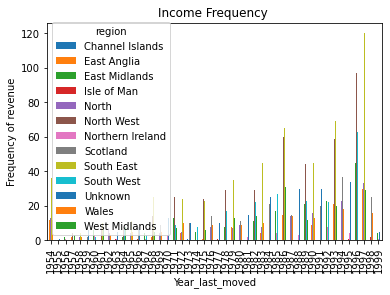

In [363]:
pd.crosstab(cc_train_data2.year_last_moved,cc_train_data2["region"]).plot(kind='bar')
plt.title('Income Frequency ')
plt.xlabel('Year_last_moved')
plt.ylabel('Frequency of revenue')
plt.show()

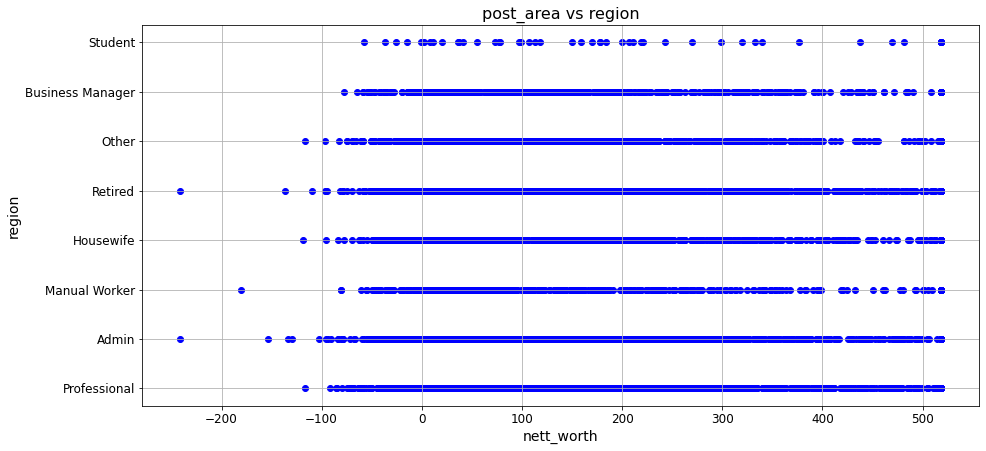

In [364]:
# Create a figure of 15 x 7 inches
fig = plt.figure(figsize=(15, 7))

# Plot a scatterplot between 48df886f9 and target
plt.scatter(x=cc_train_data2['nett_worth'], y=cc_train_data2['occupation'].values, c = 'blue')
#plt.scatter(x=np.log(cc_train_data2['year_last_moved']), y=np.log(cc_train_data2['region']))

# Add cosmetics
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel(xlabel='nett_worth', size=14)
plt.ylabel(ylabel='region', size=14)
plt.title(label='post_area vs region', size=16)
plt.grid(b=True)

# Display the output
plt.show()

In [365]:
cc_train_data2[['family_income','nett_worth']].groupby(by = 'family_income').describe()

nett_worth                                                              
                       count     mean      std      min     25%      50%      75%      max
family_income                                                                             
< 4,000                341.0  153.713  141.861  -74.930  50.240  111.950  229.650  518.592
< 8,000, >= 4,000      328.0  140.797  129.028  -95.040  47.790  107.875  198.120  518.592
<10,000, >= 8,000      452.0  159.358  148.276  -60.790  45.252  117.765  240.073  518.592
<12,500, >=10,000      535.0  149.559  149.035 -180.670  35.205  109.040  234.080  518.592
<15,000, >=12,500      508.0  145.023  138.989 -241.087  45.685  113.825  204.330  518.592
<17,500, >=15,000      521.0  150.549  153.232 -133.600  38.900  103.840  225.960  518.592
<20,000, >=17,500      525.0  148.215  148.297 -241.087  37.400  107.950  219.530  518.592
<22,500, >=20,000      479.0  156.944  148.633 -118.460  46.145  127.910  215.650  518.592
<25,000, >=22,500      656.0  164.931  153.786 -109.690  44.453  121.250  250.595  518.592
<27,500, >=25,000      969.0  156.761  149.341 -153.560  46.890  120.960  239.540  518.592
<30,000, >=27,500      796.0  164.537  152.122  -86.190  52.447  120.385  238.185  518.592
>=35,000              2014.0  162.151  156.081 -116.880  41.955  120.655  245.065  518.592

# Data Post processing

In [366]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [367]:
cc_train_data2['age_band']= le.fit_transform(cc_train_data2['age_band'])
cc_train_data2['status']= le.fit_transform(cc_train_data2['age_band'])
cc_train_data2['family_income']= le.fit_transform(cc_train_data2['family_income'])
cc_train_data2['year_last_moved']= le.fit_transform(cc_train_data2['year_last_moved'])
cc_train_data2['occupation'] = le.fit_transform(cc_train_data2['occupation'])
cc_train_data2['occupation_partner'] = le.fit_transform(cc_train_data2['occupation_partner'])
cc_train_data2['home_status'] = le.fit_transform(cc_train_data2['home_status'])
cc_train_data2['region'] = le.fit_transform(cc_train_data2['region'])
cc_train_data2['self_employed'] = le.fit_transform(cc_train_data2['self_employed'])
cc_train_data2['self_employed_partner'] = le.fit_transform(cc_train_data2['self_employed_partner'])
cc_train_data2['gender'] = le.fit_transform(cc_train_data2['gender'])

In [368]:
cc_test_data2['age_band']= le.fit_transform(cc_test_data2['age_band'])
cc_test_data2['status']= le.fit_transform(cc_test_data2['age_band'])
cc_test_data2['family_income']= le.fit_transform(cc_test_data2['family_income'])
cc_test_data2['year_last_moved']= le.fit_transform(cc_test_data2['year_last_moved'])
cc_test_data2['occupation'] = le.fit_transform(cc_test_data2['occupation'])
cc_test_data2['occupation_partner'] = le.fit_transform(cc_test_data2['occupation_partner'])
cc_test_data2['home_status'] = le.fit_transform(cc_test_data2['home_status'])
cc_test_data2['region'] = le.fit_transform(cc_test_data2['region'])
cc_test_data2['self_employed'] = le.fit_transform(cc_test_data2['self_employed'])
cc_test_data2['self_employed_partner'] = le.fit_transform(cc_test_data2['self_employed_partner'])
cc_test_data2['gender'] = le.fit_transform(cc_test_data2['gender'])

In [369]:
cc_train_data2.head()

,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,revenue_grid,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,3,3,5,5,0,11,0,0,27,26.98,29.99,108.85,7.68,0,5,2,268.603,329.94
9091,0,6,6,0,5,0,11,0,0,43,35.98,74.48,48.45,18.70,0,5,2,110.950,160.65
9744,1,4,4,3,3,1,7,1,1,42,0.00,24.46,0.00,0.00,0,9,2,18.440,40.09
10700,2,3,3,3,3,0,8,0,0,36,44.99,0.00,0.00,0.00,0,7,2,29.990,88.98
1987,0,8,8,2,5,0,11,0,0,35,0.00,0.00,0.00,0.00,0,10,2,0.000,15.18


In [370]:
# Rearranging the columns
cc_train_data2 = cc_train_data2[['children', 'age_band', 'status', 'home_status', 'family_income','occupation', 
        'occupation_partner', 'self_employed', 'self_employed_partner', 'year_last_moved', 'average_credit_card_transaction',
        'balance_transfer', 'average_a/c_balance','online_purchase_amount', 'gender', 'region','total_insurance',
        'nett_worth','revenue_grid']]

In [371]:
cc_test_data2 = cc_test_data2[['children', 'age_band', 'status', 'home_status', 'family_income','occupation', 
        'occupation_partner', 'self_employed', 'self_employed_partner', 'year_last_moved', 'average_credit_card_transaction',
        'balance_transfer', 'average_a/c_balance','online_purchase_amount', 'gender', 'region','total_insurance',
        'nett_worth']]

In [372]:
num_cols = ['year_last_moved', 'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
            'online_purchase_amount', 'total_insurance', 'nett_worth', 'revenue_grid']
num_df = pd.DataFrame(num_cols)

In [373]:
abs(cc_train_data2.corr()).sort_values(by='revenue_grid', ascending=False).T.style.background_gradient(cmap='coolwarm_r')

,revenue_grid,online_purchase_amount,nett_worth,total_insurance,average_credit_card_transaction,average_a/c_balance,balance_transfer,family_income,year_last_moved,age_band,status,gender,region,children,self_employed_partner,occupation_partner,self_employed,occupation,home_status
children,0.013,0.034,0.035,0.054,0.013,0.035,0.028,0.260,0.222,0.418,0.418,0.014,0.004,1.000,0.116,0.163,0.055,0.175,0.048
age_band,0.016,0.031,0.042,0.049,0.032,0.040,0.028,0.432,0.485,1.000,1.000,0.067,0.040,0.418,0.096,0.318,0.039,0.396,0.056
status,0.016,0.031,0.042,0.049,0.032,0.040,0.028,0.432,0.485,1.000,1.000,0.067,0.040,0.418,0.096,0.318,0.039,0.396,0.056
home_status,0.001,0.005,0.007,0.016,0.013,0.003,0.004,0.257,0.062,0.056,0.056,0.028,0.009,0.048,0.043,0.025,0.033,0.041,1.000
family_income,0.022,0.026,0.034,0.050,0.027,0.037,0.026,1.000,0.292,0.432,0.432,0.128,0.036,0.260,0.111,0.212,0.119,0.213,0.257
occupation,0.005,0.019,0.016,0.027,0.005,0.031,0.016,0.213,0.163,0.396,0.396,0.192,0.025,0.175,0.103,0.280,0.051,1.000,0.041
occupation_partner,0.005,0.015,0.014,0.029,0.015,0.016,0.002,0.212,0.152,0.318,0.318,0.140,0.001,0.163,0.013,1.000,0.057,0.280,0.025
self_employed,0.005,0.002,0.004,0.016,0.007,0.011,0.018,0.119,0.035,0.039,0.039,0.114,0.003,0.055,0.241,0.057,1.000,0.051,0.033
self_employed_partner,0.007,0.002,0.010,0.026,0.001,0.021,0.012,0.111,0.023,0.096,0.096,0.111,0.011,0.116,1.000,0.013,0.241,0.103,0.043
year_last_moved,0.017,0.030,0.022,0.020,0.026,0.014,0.016,0.292,1.000,0.485,0.485,0.023,0.032,0.222,0.023,0.152,0.035,0.163,0.062


<AxesSubplot:>

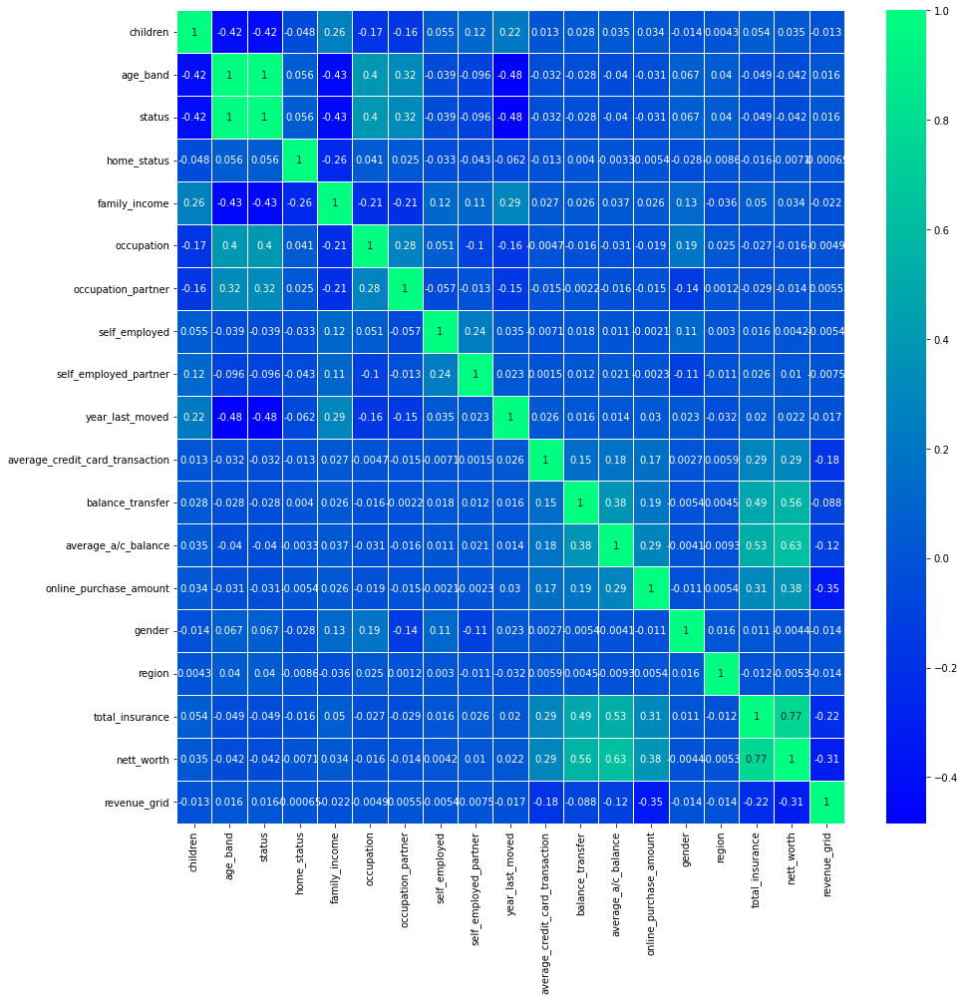

In [374]:
corrmat = cc_train_data2.corr()
 # plot
fig, ax = plt.subplots()
fig.set_size_inches(15,15)
sns.heatmap(corrmat,linewidths=1, cmap ='winter',annot=True)

In [375]:
cc_train_data2.shape

(8124, 19)

In [376]:
cc_train_data2.head()

,children,age_band,status,home_status,family_income,occupation,occupation_partner,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,total_insurance,nett_worth,revenue_grid
ref_no,,,,,,,,,,,,,,,,,,,
5466,2,3,3,0,11,5,5,0,0,27,26.98,29.99,108.85,7.68,0,5,268.603,329.94,2
9091,0,6,6,0,11,0,5,0,0,43,35.98,74.48,48.45,18.70,0,5,110.950,160.65,2
9744,1,4,4,1,7,3,3,1,1,42,0.00,24.46,0.00,0.00,0,9,18.440,40.09,2
10700,2,3,3,0,8,3,3,0,0,36,44.99,0.00,0.00,0.00,0,7,29.990,88.98,2
1987,0,8,8,0,11,2,5,0,0,35,0.00,0.00,0.00,0.00,0,10,0.000,15.18,2


In [377]:
cc_test_data2.head()

,children,age_band,status,home_status,family_income,occupation,occupation_partner,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,
697,0,11,11,0,3,6,2,0,0,17,41.98,55.47,44.47,0.000,1,8,79.96,187.98
7897,0,3,3,0,11,4,1,0,0,40,0.00,0.00,29.49,22.462,1,7,135.33,394.66
4729,0,11,11,0,4,2,6,0,0,2,0.00,154.47,87.83,0.000,0,8,67.47,327.13
6914,1,1,1,0,5,4,4,0,0,37,18.98,60.98,0.00,0.000,0,6,27.98,104.24
2795,0,10,10,0,0,6,4,0,0,20,0.00,144.90,32.98,5.450,0,7,123.38,228.78


In [378]:
cc_test_data2.shape

(2031, 18)

<a name = Section7></a>

---
#  Model  Development & Evaluation 
---

In [379]:
cc_test_data2.columns

Index(['children', 'age_band', 'status', 'home_status', 'family_income', 'occupation',
       'occupation_partner', 'self_employed', 'self_employed_partner', 'year_last_moved',
       'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
       'online_purchase_amount', 'gender', 'region', 'total_insurance', 'nett_worth'],
      dtype='object')

In [380]:
cc_train_data2.columns

Index(['children', 'age_band', 'status', 'home_status', 'family_income', 'occupation',
       'occupation_partner', 'self_employed', 'self_employed_partner', 'year_last_moved',
       'average_credit_card_transaction', 'balance_transfer', 'average_a/c_balance',
       'online_purchase_amount', 'gender', 'region', 'total_insurance', 'nett_worth',
       'revenue_grid'],
      dtype='object')

In [381]:
X_test = cc_test_data2.copy()

In [382]:
X_train = cc_train_data2.drop(['revenue_grid'], axis=1)
y_train = cc_train_data2['revenue_grid']
X_train.shape

(8124, 18)

In [383]:
# TEST DATa
X_test.shape

(2031, 18)

In [384]:
X_train.head()

,children,age_band,status,home_status,family_income,occupation,occupation_partner,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,
5466,2,3,3,0,11,5,5,0,0,27,26.98,29.99,108.85,7.68,0,5,268.603,329.94
9091,0,6,6,0,11,0,5,0,0,43,35.98,74.48,48.45,18.70,0,5,110.950,160.65
9744,1,4,4,1,7,3,3,1,1,42,0.00,24.46,0.00,0.00,0,9,18.440,40.09
10700,2,3,3,0,8,3,3,0,0,36,44.99,0.00,0.00,0.00,0,7,29.990,88.98
1987,0,8,8,0,11,2,5,0,0,35,0.00,0.00,0.00,0.00,0,10,0.000,15.18


In [385]:
nf_train = X_train.select_dtypes(exclude='object')
nf_train_cols = nf_train.columns.tolist()
nf_train_cols

['children',
 'age_band',
 'status',
 'home_status',
 'family_income',
 'occupation',
 'occupation_partner',
 'self_employed',
 'self_employed_partner',
 'year_last_moved',
 'average_credit_card_transaction',
 'balance_transfer',
 'average_a/c_balance',
 'online_purchase_amount',
 'gender',
 'region',
 'total_insurance',
 'nett_worth']

In [386]:
nf_train

,children,age_band,status,home_status,family_income,occupation,occupation_partner,self_employed,self_employed_partner,year_last_moved,average_credit_card_transaction,balance_transfer,average_a/c_balance,online_purchase_amount,gender,region,total_insurance,nett_worth
ref_no,,,,,,,,,,,,,,,,,,
5466,2,3,3,0,11,5,5,0,0,27,26.98,29.990,108.850,7.68,0,5,268.603,329.940
9091,0,6,6,0,11,0,5,0,0,43,35.98,74.480,48.450,18.70,0,5,110.950,160.650
9744,1,4,4,1,7,3,3,1,1,42,0.00,24.460,0.000,0.00,0,9,18.440,40.090
10700,2,3,3,0,8,3,3,0,0,36,44.99,0.000,0.000,0.00,0,7,29.990,88.980
1987,0,8,8,0,11,2,5,0,0,35,0.00,0.000,0.000,0.00,0,10,0.000,15.180
3309,0,6,6,0,11,0,1,0,0,30,9.49,0.010,0.000,0.00,0,6,56.400,36.880
6610,0,4,4,0,10,0,0,1,0,32,9.99,0.000,26.960,5.49,0,12,0.000,114.940
10621,0,9,9,0,6,6,6,0,0,44,0.00,0.000,0.000,0.00,1,5,0.000,55.670
2630,1,6,6,0,11,5,5,0,0,26,0.00,82.960,0.000,0.00,0,10,52.960,52.750


<a name = Section71></a>
### Logistic Regression - Baseline Model**

- Now we will **standardize** the columns of the dataframe using `StandardScaler`. 

In [387]:
logreg = LogisticRegression()
logreg.fit(X_train,y_train)

LogisticRegression()


## ** Using Trained Model for Prediction**

In [388]:
#predicting on train data
y_pred_train = logreg.predict(X_train)

In [389]:
LR2 = pd.DataFrame({'Actual value ': y_train, 'Predicted value': y_pred_train})
LR2.tail(20)

,Actual value,Predicted value
ref_no,,
3853,2,2
5185,2,2
1348,2,2
7299,2,2
5741,2,1
6036,2,2
2779,2,1
7899,2,2
866,2,2


### Checking Confusion Matrix
- A __confusion matrix__ is a __summary__ of prediction results on a classification problem.

- The **number of correct and incorrect predictions** are summarized with count values and **broken down by each class**. <br/>
Below is a diagram showing a general confusion matrix.


|   | Predicted  NO    | Predicted  YES  |   |
| :------------ | :------------ | :------------ | :------------ |
|   |   |   |   |
|  Actual No |   True Negative | False Positive Type I error   | Specificity  = TN/( TN + FP)   |
|  Actual Yes | False Negative  Type II error   |  True Positive |   Sensitivity  = TP/( TP + FN)   | |
| |  Total  Negative  Predictive  = TN / ( TN + FN |  Precision = TP / ( TP + FP) |   Accuracy  = TP + TN/( TP + TN + FP+ FN)   | |
|   |   |   |   |
|   |Recall = TP/(FN + TP)   |  Precision = TP / ( TP+FP ) | F1- score = 2 / (1/Recall) +(1/Precision)  |

- **True Positive (TP)** : Observation is positive, and is predicted to be positive.
- **False Negative (FN)** : Observation is positive, but is predicted negative.
- **True Negative (TN)** : Observation is negative, and is predicted to be negative.
- **False Positive (FP)** : Observation is negative, but is predicted positive.

In [390]:
cc_train_data2['revenue_grid'].value_counts()

2    7264
1     860
Name: revenue_grid, dtype: int64

In [391]:
confusion_matrix = pd.DataFrame(confusion_matrix(y_train, y_pred_train))

In [392]:
confusion_matrix.index = ['Actual HNI - High', 'Actual HNI - Low']
confusion_matrix.columns = ['Predicted HNI - High','Predicted  HNI - Low']
print(confusion_matrix)

                   Predicted HNI - High  Predicted  HNI - Low
Actual HNI - High                   139                   721
Actual HNI - Low                    181                  7083


**Observations** 
- True Positive(TP) = 139
- True Negative(TN) = 7083
- False Positive(FP) = 181
- False Negative(FN) = 721

In [393]:
confusion = metrics.confusion_matrix(y_train, y_pred_train)
TP = confusion[1, 1]
TN = confusion[0, 0]
FP = confusion[0, 1]
FN = confusion[1, 0]

In [394]:
# print the first 25 true and predicted responses of the training data
print('Actual:', y_train.values[0:25])
print('Pred:', y_pred_train[0:25])

Actual: [2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 1 2 2 1 2 2 2 2]
Pred: [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 1 1 2 2 2]


### Classification Report

In [395]:
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

           1       0.43      0.16      0.24       860
           2       0.91      0.98      0.94      7264

    accuracy                           0.89      8124
   macro avg       0.67      0.57      0.59      8124
weighted avg       0.86      0.89      0.87      8124



### Checking Accuracy on the train data

In [396]:
print('Accuracy score for test data is:',accuracy_score(y_train, y_pred_train))

Accuracy score for test data is: 0.8889709502708025


### Classification Error: Overall, how often is the classifier incorrect?
- Also known as "Misclassification Rate"

In [397]:
print((FP + FN) / (TP + TN + FP + FN))
print(1 - metrics.accuracy_score(y_train, y_pred_train))

0.11102904972919744
0.11102904972919747


### Sensitivity: When the actual value is positive, how often is the prediction correct?
- How "sensitive" is the classifier to detecting positive instances? Also known as "True Positive Rate" or "Recall"

In [398]:
print(TP / (TP + FN))
print(metrics.recall_score(y_train, y_pred_train))

0.9750825991189427
0.16162790697674417


### Specificity: When the actual value is negative, how often is the prediction correct?
- How "specific" (or "selective") is the classifier in predicting positive instances?

In [399]:
print(TN / (TN + FP))

0.16162790697674417


### False Positive Rate: When the actual value is negative, how often is the prediction incorrect?

In [400]:
print(FP / (TN + FP))

0.8383720930232558


### Precision: When a positive value is predicted, how often is the prediction correct?

- How "precise" is the classifier when predicting positive instances?

In [401]:
print(TP / (TP + FP))
print(metrics.precision_score(y_train, y_pred_train))

0.9076114812916453
0.434375


### ROC Curves and Area Under the Curve (AUC)

- Question: Wouldn't it be nice if we could see how sensitivity and specificity are affected by various thresholds, without actually changing the threshold?

- Answer: Plot the ROC curve!

## AUC is the **percentage** of the ROC plot that is **underneath the curve**:


In [402]:
# IMPORTANT: first argument is true values, second argument is predicted probabilities
print(metrics.roc_auc_score(y_train, y_pred_train))

0.5683552530478434


In [403]:
preds1 = np.where(logreg.predict_proba(X_train)[:,1]> 0.75,1,0)
print('Accuracy score for train data is:', accuracy_score(y_train,preds1))

Accuracy score for train data is: 0.05822255046774988


In [404]:
preds2 = np.where(logreg.predict_proba(X_train)[:,1]> 0.3,1,0)
print('Accuracy score for train data is:', accuracy_score(y_train,preds2))

Accuracy score for train data is: 0.10007385524372231


In [405]:
preds3 = np.where(logreg.predict_proba(X_train)[:,1]> 0.5,1,0)
print('Accuracy score for train data is:', accuracy_score(y_train,preds3))

Accuracy score for train data is: 0.08874938453963564


# Predicting on train data

### Adjusting the classification threshold¶

In [406]:
# print the first 10 predicte responses
y_pred_train = logreg.predict(X_train)[0:10]

In [407]:
# print the first 10 predicted probabilities of class membership
logreg.predict_proba(X_train)[0:10, :]

array([[0.09861325, 0.90138675],
       [0.08514632, 0.91485368],
       [0.02561104, 0.97438896],
       [0.09122385, 0.90877615],
       [0.0102109 , 0.9897891 ],
       [0.04009396, 0.95990604],
       [0.09597809, 0.90402191],
       [0.01539197, 0.98460803],
       [0.01201087, 0.98798913],
       [0.03145623, 0.96854377]])

In [408]:
# print the first 10 predicted probabilities for class 1
logreg.predict_proba(X_train)[0:10, 1]

array([0.90138675, 0.91485368, 0.97438896, 0.90877615, 0.9897891 ,
       0.95990604, 0.90402191, 0.98460803, 0.98798913, 0.96854377])

In [409]:
# store the predicted probabilities for class 1
y_pred_prob = logreg.predict_proba(X_train)[:, 1]
y_pred_prob

array([0.90138675, 0.91485368, 0.97438896, ..., 0.9122943 , 0.98669487,
       0.8267568 ])

Text(0, 0.5, 'Frequency')

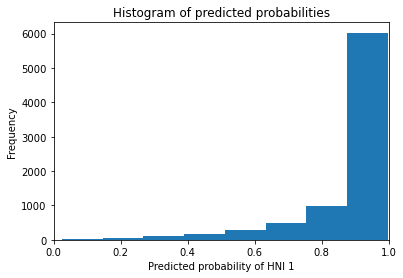

In [410]:
# histogram of predicted probabilities
plt.hist(y_pred_prob, bins=8)
plt.xlim(0, 1)
plt.title('Histogram of predicted probabilities')
plt.xlabel('Predicted probability of HNI 1')
plt.ylabel('Frequency')

##**Decrease the threshold** for predicting HNI in order to **increase the sensitivity** of the classifier

In [418]:
# predict survived if the predicted probability is greater than 0.3
from sklearn.preprocessing import binarize
y_pred_class = binarize([y_pred_prob], threshold=0.3)[0]
y_pred_class

array([1., 1., 1., ..., 1., 1., 1.])

In [419]:
# print the first 10 predicted probabilities
y_pred_prob[0:10]

array([0.90138675, 0.91485368, 0.97438896, 0.90877615, 0.9897891 ,
       0.95990604, 0.90402191, 0.98460803, 0.98798913, 0.96854377])

In [420]:
# print the first 10 predicted classes with the lower threshold
y_pred_class[0:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [421]:
print(confusion)

[[ 139  721]
 [ 181 7083]]


In [422]:
# new confusion matrix (threshold of 0.3)
print(metrics.confusion_matrix(y_train, y_pred_class))

[[   0    0    0]
 [  47  813    0]
 [  32 7232    0]]


In [ ]:
X_test.columns

In [ ]:
y_pred_test = logreg.predict(X_test)

In [ ]:
#Printing some sample values of prediction for test data
p_test = 'revenue_grid'
test_cols = X_test.columns.copy()
test_results = pd.DataFrame(data=X_test, columns=test_cols)
test_results[('Predicted on TEST data ' + p_test)]=y_pred_test.round(0)
test_results.head(10)

In [ ]:
# To create Dataframe of predicted value with particular respective index
predicted_revenue_grid = pd.DataFrame(y_pred_test) 
predicted_revenue_grid.index = X_test.index 
predicted_revenue_grid.columns = ["revenue_grid_prediction_test_data"]
# To download the csv file locally
#from google.colab import files
predicted_revenue_grid.to_csv('cust_class_project_submission_sagar.csv',header=False)
#files.download('cust_class_project_submission_sagar.csv')

Comparing Logistic Regression with Other Models

Advantages of logistic regression:

- Highly interpretable (if you remember how)
- Model training and prediction are fast
- No tuning is required (excluding regularization)
- Features don't need scaling
- Can perform well with a small number of observations
- Outputs well-calibrated predicted probabilities

Disadvantages of logistic regression:

- Presumes a linear relationship between the features and the log-odds of the response
- Performance is (generally) not competitive with the best supervised learning methods
- Can't automatically learn feature interactions